In [30]:
import numpy as np 
import matplotlib.pyplot as plt
import pyopenlpt as lpt

redirector = lpt.PythonStreamRedirector()

from IPython.core.magic import register_cell_magic

@register_cell_magic
def skip(line, cell):
    print("⏭️ skipped this cell")
    # 什么都不执行，直接返回
    return

In [31]:
config_file = "D:/0.Code/Test/SD0075/config.txt"
basic_settings = lpt.BasicSetting()
basic_settings.readConfig(config_file)
print(dir(basic_settings))  # 查看有哪些属性
cam_list = basic_settings._cam_list

for name in dir(basic_settings):
    if not name.startswith("__"):  # 跳过内置方法
        try:
            print(name, "=", getattr(basic_settings, name))
        except Exception:
            pass

['__class__', '__delattr__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '_axis_limit', '_cam_list', '_fps', '_frame_end', '_frame_start', '_image_file_paths', '_load_track', '_load_track_frame', '_load_track_path', '_n_cam', '_n_thread', '_object_config_paths', '_object_types', '_output_path', '_pybind11_conduit_v1_', '_voxel_to_mm', 'readConfig']
_axis_limit = <pyopenlpt.AxisLimit object at 0x0000025A433BB4B0>
_cam_list = [<Camera type=0 active=True size=1024x1024>, <Camera type=0 active=True size=1024x1024>, <Camera type=0 active=True size=1024x1024>, <Camera type=0 active=True size=1024x1024>]
_fps = 1
_frame_end = 149
_frame_start = 0
_image_file_paths = ['D:/0.Code/Test/SD0075/imgFile2/cam1ImageNames.txt', 'D:/0.Code/Test/S

In [32]:
from pprint import pprint

tr_cfg = lpt.TracerConfig()
tr_cfg.readConfig(basic_settings._object_config_paths[0], basic_settings)


True

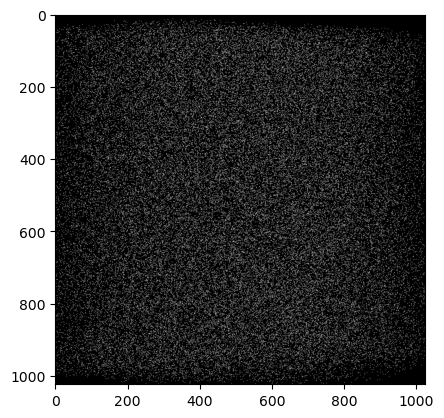

In [33]:
# create ImageIO instances for each image path
imgio_list = []
for path in basic_settings._image_file_paths:
    io = lpt.ImageIO()
    io.loadImgPath("", path)
    imgio_list.append(io)

num_cams = len(imgio_list)
frame_id = 0

image_list = []
for i in range(num_cams):
    image_list.append(imgio_list[i].loadImg(frame_id))

arr = np.array(image_list[0].to_list(), dtype=np.uint8)

plt.imshow(arr, cmap="gray")
plt.show()

Camera 0: found 52928 objects.
Camera 1: found 53140 objects.
Camera 2: found 52731 objects.
Camera 3: found 52643 objects.


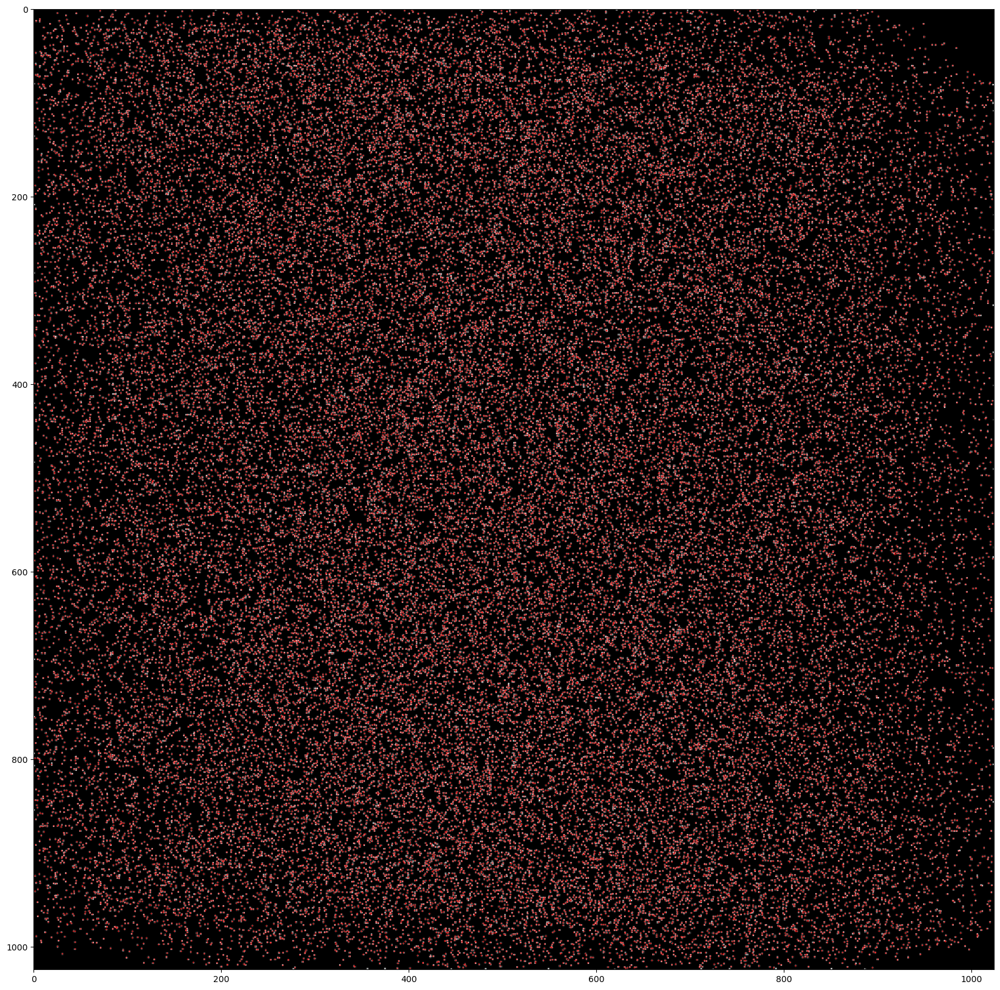

In [34]:
obj_finder = lpt.ObjectFinder2D()
n_cams = len(cam_list)
obj2d_list = []
for cam_id in range(n_cams):
    obj2ds = obj_finder.findObject2D(image_list[cam_id], tr_cfg)
    obj2d_list.append(obj2ds)
    print(f"Camera {cam_id}: found {len(obj2ds)} objects.")

img = np.array(image_list[1].to_list(), dtype=np.uint8)
points = obj2d_list[1]
xs = [p._pt_center[0] for p in points]
ys = [p._pt_center[1] for p in points]

def show_pixels(img, xs=None, ys=None, scale=1.0):
    """
    零边距像素级显示：
      - scale：把图在屏幕上按倍数放大（不改变数据像素）
    """
    H, W = img.shape[:2]
    dpi = plt.rcParams.get('figure.dpi', 100)
    fig_w = (W * scale) / dpi
    fig_h = (H * scale) / dpi

    plt.figure(figsize=(fig_w, fig_h), dpi=dpi, frameon=False)

    # plt.imshow(img, cmap='gray', interpolation='nearest')
    # set the extent to match pixel coordinates: the center of the top-left pixel is at (0.5, 0.5)
    plt.imshow(img, extent=(0, W, H, 0), origin='upper', cmap='gray', interpolation='nearest')

    # xs = np.asarray(xs, dtype=float) - 0.5
    # ys = np.asarray(ys, dtype=float) - 0.5
    if xs is not None and ys is not None:
        plt.plot(xs , ys, 'r.', markersize=1)  # 像素级标记
    plt.plot(0, 0, 'g.', markersize=1)  # 原点标记
    plt.show()

show_pixels(img, xs, ys, scale=2.0)

In [35]:
# test stereo matching
stereomatch = lpt.StereoMatch(cam_list, obj2d_list, tr_cfg)

with lpt.PythonStreamRedirector():
    obj3d_list = stereomatch.match()
print(f"Matched {len(obj3d_list)} 3D objects.")

# only match_cam_count cams have valid 2D projections
n_check = min(10, len(obj3d_list))

for i, obj in enumerate(obj3d_list[:n_check]):
    valid_cams = [c for c, o2d in enumerate(obj._obj2d_list) if o2d is not None]
    n_valid = len(valid_cams)
    print(f"obj#{i}: total cams={len(obj._obj2d_list)}, valid 2D={n_valid}, cams={valid_cams}")

obj = obj3d_list[0]
print("2D points on all cameras for the first matched 3D object:", [o._pt_center if o is not None else None for o in obj._obj2d_list])
obj.projectObject2D(cam_list)
print("2D points on all cameras for the first matched 3D object:", [o._pt_center for o in obj._obj2d_list])

# k = 1
# img = np.array(image_list[k].to_list(), dtype=np.uint8)
# # plot the 2D points if they are in camera 1
# xs = [obj._obj2d_list[k]._pt_center[0] for obj in obj3d_list if obj._obj2d_list[k] is not None]
# ys = [obj._obj2d_list[k]._pt_center[1] for obj in obj3d_list if obj._obj2d_list[k] is not None]
# print(len(xs))
# show_pixels(img, xs, ys, scale=2.0)

# for obj in obj3d_list:
#     obj.projectObject2D(cam_list) # you need to calculate 2D projections for all cameras

# # plot the 2D detections of stereo matched objects on camera 2
# xs = [obj._obj2d_list[k]._pt_center[0] for obj in obj3d_list]
# ys = [obj._obj2d_list[k]._pt_center[1] for obj in obj3d_list]


# show_pixels(img, xs, ys, scale=2.0)

Matched 23638 3D objects.
obj#0: total cams=4, valid 2D=4, cams=[0, 1, 2, 3]
obj#1: total cams=4, valid 2D=4, cams=[0, 1, 2, 3]
obj#2: total cams=4, valid 2D=4, cams=[0, 1, 2, 3]
obj#3: total cams=4, valid 2D=4, cams=[0, 1, 2, 3]
obj#4: total cams=4, valid 2D=4, cams=[0, 1, 2, 3]
obj#5: total cams=4, valid 2D=4, cams=[0, 1, 2, 3]
obj#6: total cams=4, valid 2D=4, cams=[0, 1, 2, 3]
obj#7: total cams=4, valid 2D=4, cams=[0, 1, 2, 3]
obj#8: total cams=4, valid 2D=4, cams=[0, 1, 2, 3]
obj#9: total cams=4, valid 2D=4, cams=[0, 1, 2, 3]
2D points on all cameras for the first matched 3D object: [<Pt2D (301.500000,14.309690)>, <Pt2D (888.985088,3.624913)>, <Pt2D (99.623388,6.157190)>, <Pt2D (385.278663,44.033770)>]
2D points on all cameras for the first matched 3D object: [<Pt2D (301.496840,14.304850)>, <Pt2D (888.982720,3.627746)>, <Pt2D (99.624054,6.158295)>, <Pt2D (385.275087,44.034607)>]


In [36]:
# check ghost objs
import sys, pathlib
repo_root = pathlib.Path.cwd().parent          # for finding openLPT_utils
sys.path.insert(0, str(repo_root))

import numpy as np
from scipy.io import loadmat
from openLPT_utils.ghost_eval import find_ghosts
import matplotlib.pyplot as plt


# check the ghost objs from the stereomatch step
track_path = "D:/0.Code/Test/SD0075/particles_75k_100f.mat"
tracks = loadmat(track_path)['tracks']  

pts_groundtrue = tracks[tracks[:, 3] == 1, :3].astype(np.float32)

print(f"number of objects in GT: {len(pts_groundtrue)}, reconstructed: {len(obj3d_list)}")
pts_reconstructed = np.array(
    [[obj._pt_center[0], obj._pt_center[1], obj._pt_center[2]] for obj in obj3d_list], 
    dtype=np.float32)

tol_mm = 0.6 * .04
cmp_st = find_ghosts(pts_groundtrue, pts_reconstructed, tol_mm, use_ckdtree=True)

print(f"real={len(cmp_st['matched_indices'])}, ghosts={len(cmp_st['ghost_indices'])}")

print(f"repeated rec points: {len(cmp_st['repeated_indices'])}")
for k, rec_idxs in list(cmp_st["gt_to_rec"].items())[:20]:
    if len(rec_idxs) >= 2:
        print(f"GT #{k} <- rec {rec_idxs.tolist()}")

# from matplotlib.ticker import FormatStrFormatter, MaxNLocator

# d = np.asarray(cmp_st['dist_mm'], float)
# d = d[np.isfinite(d)]
# if d.size == 0:
#     print("dist_mm 为空")
# else:
#     p99 = np.percentile(d, 99)           # 只看前 99%，避免长尾挤压
#     xmin, xmax = 0.0, p99
#     bin_count = 50                       # 想更平滑就调大/调小

#     fig, ax = plt.subplots(figsize=(6, 3), dpi=150)
#     ax.hist(d, bins=bin_count, range=(xmin, xmax), density=False, alpha=0.85)
#     if 'tol_mm' in globals():
#         ax.axvline(float(tol_mm), ls='--')
#     ax.set_xlim(xmin, xmax)
#     ax.xaxis.set_major_formatter(FormatStrFormatter('%.3f'))  # 一位小数
#     ax.xaxis.set_major_locator(MaxNLocator(nbins=6))          # 控制刻度数量
#     ax.set_xlabel('distance (mm)')
#     ax.set_ylabel('count')
#     ax.set_title('dist_mm histogram')
#     plt.tight_layout(); plt.show()

number of objects in GT: 75000, reconstructed: 23638
real=23214, ghosts=424
repeated rec points: 0


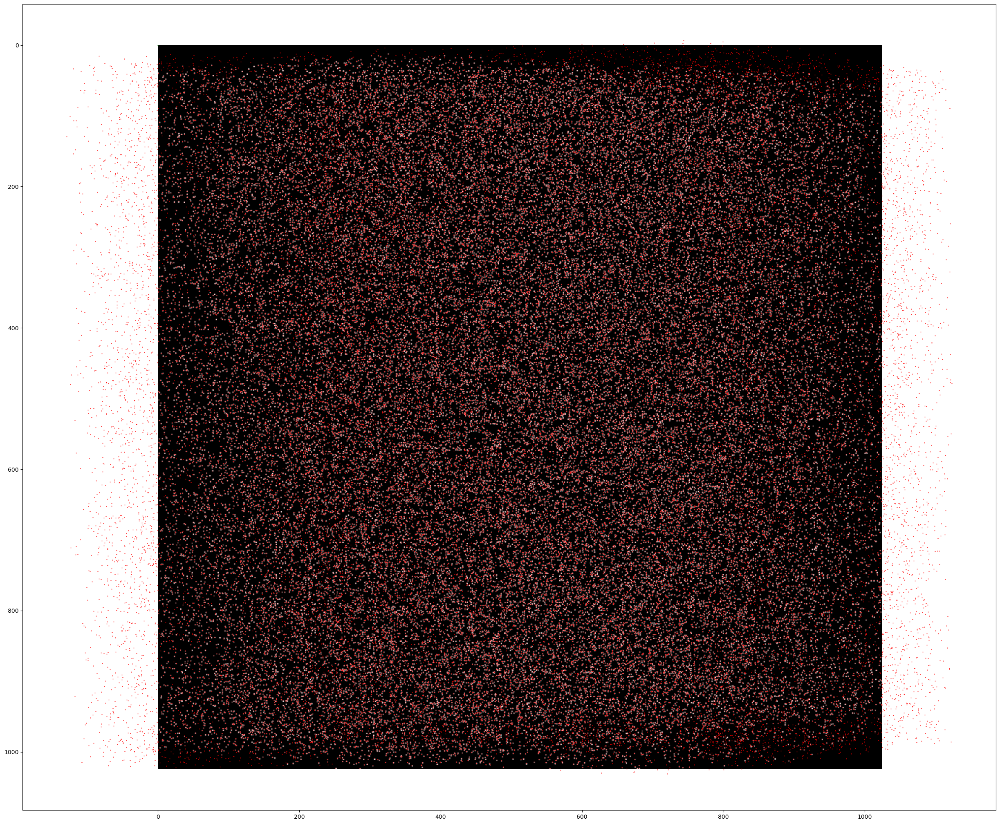

In [37]:
tracer_groundture = [lpt.Tracer3D(lpt.Pt3D(pts_groundtrue[i, 0], pts_groundtrue[i, 1], pts_groundtrue[i, 2])) for i in range(len(pts_groundtrue))]

for tr in tracer_groundture:
    tr.projectObject2D(cam_list)

k = 0
img = np.array(image_list[k].to_list(), dtype=np.uint8)

xs = [tr._obj2d_list[k]._pt_center[0] for tr in tracer_groundture]
ys = [tr._obj2d_list[k]._pt_center[1] for tr in tracer_groundture]
show_pixels(img, xs, ys, scale=3.0)


In [38]:
# check how many GT points are hit in all active cameras, and among them how many are reconstructed
import numpy as np
from scipy.spatial import cKDTree

def _in_img(u, W, H):
    x, y = float(u[0]), float(u[1])
    return np.isfinite(x) and np.isfinite(y) and 0.0 <= x < W and 0.0 <= y < H

def _ls_intersection(lines, fallback=None):
    # lines: list of Line2D (有 .pt 与 .unit_vector，方向为单位向量)
    if not lines: return fallback
    A = np.zeros((2,2)); b = np.zeros(2); anchor = []
    for L in lines:
        px,py = float(L.pt[0]), float(L.pt[1])
        ux,uy = float(L.unit_vector[0]), float(L.unit_vector[1])
        nx,ny = -uy, ux
        A[0,0]+=nx*nx; A[0,1]+=nx*ny; A[1,0]+=ny*nx; A[1,1]+=ny*ny
        b[0]+=nx*(nx*px+ny*py); b[1]+=ny*(nx*px+ny*py)
        anchor.append((px,py))
    det = np.linalg.det(A)
    if abs(det) < 1e-9:
        return fallback if fallback is not None else tuple(np.mean(anchor,0))
    q = np.linalg.solve(A,b)
    return (float(q[0]), float(q[1]))

def _pt_within_all_lines(q, lines, tol_px):
    qx,qy = float(q[0]), float(q[1]); tol2 = float(tol_px)*float(tol_px)
    for L in lines:
        px,py = float(L.pt[0]), float(L.pt[1])
        ux,uy = float(L.unit_vector[0]), float(L.unit_vector[1])
        dx,dy = (qx-px),(qy-py)
        if (dy*ux - dx*uy)**2 > tol2: return False
    return True

def gt_hits_all_active_cams_indices(pts_gt, cam_list, obj2d_list, stereomatch, tol_2d_px, lpt, search_radius_factor=2.0):
    """
    返回：命中所有 active 相机的 GT 点索引（np.ndarray[int]）
    判据：存在某个检测点 q，使得 q 到“其它相机GT投影生成的极线”均 ≤ tol_2d_px
    """
    n_cams = len(cam_list)
    active = [bool(getattr(cam, "_is_active", True)) for cam in cam_list]
    W = [int(cam.getNCol()) for cam in cam_list]
    H = [int(cam.getNRow()) for cam in cam_list]

    pts2d = [np.asarray([(float(o._pt_center[0]), float(o._pt_center[1])) for o in obj2d_list[k]], float)
             if obj2d_list[k] else np.empty((0,2), float) for k in range(n_cams)]
    trees = [cKDTree(pts2d[k]) if pts2d[k].shape[0] else None for k in range(n_cams)]

    hit_idx = []
    for i in range(int(pts_gt.shape[0])):
        X = pts_gt[i]; X3 = lpt.Pt3D(float(X[0]), float(X[1]), float(X[2]))
        uv = [None]*n_cams; vis=[False]*n_cams
        for k in range(n_cams):
            if not active[k]: continue
            u = cam_list[k].project(X3)
            if _in_img(u, W[k], H[k]): uv[k]=(float(u[0]), float(u[1])); vis[k]=True

        ok_all = True
        for k in range(n_cams):
            if not active[k]: continue
            if trees[k] is None: ok_all=False; break

            # 其它可见相机 r 的极线投到相机 k
            lines_k = []
            for r in range(n_cams):
                if r==k or not active[r] or not vis[r]: continue
                los = cam_list[r].lineOfSight(lpt.Pt2D(uv[r][0], uv[r][1]))
                Lk  = stereomatch.makeLine2DFromLOS3D(k, los)  # Line2D
                lines_k.append(Lk)
            if not lines_k: ok_all=False; break

            # 以直线最小二乘交点为检索中心 → KDTree 附近候选 → 严格点-线判定
            q0 = _ls_intersection(lines_k, fallback=uv[k] if vis[k] else None)
            r_search = max(float(tol_2d_px)*float(search_radius_factor), float(tol_2d_px))
            cand = trees[k].query_ball_point(q0, r=r_search)
            if not any(_pt_within_all_lines(pts2d[k][j], lines_k, tol_2d_px) for j in cand):
                ok_all=False; break

        if ok_all: hit_idx.append(i)

    return np.asarray(hit_idx, dtype=np.int64)

def match_gt_hits_to_recon(hit_idx, pts_gt, obj3d_list, dist_tol_mm):
    """
    将命中的 GT 点 (hit_idx) 与重构点 (obj3d_list) 做最近邻匹配（世界坐标，半径 dist_tol_mm）。
    返回：
      matched_hit_idx      : 成功匹配的 GT 索引（np.int64）
      matched_recon_idx    : 对应的重构点索引（np.int64，索引到 obj3d_list）
    """
    hit_idx = np.asarray(hit_idx, dtype=np.int64)
    if hit_idx.size == 0 or not obj3d_list:
        return np.empty(0, dtype=np.int64), np.empty(0, dtype=np.int64)

    recon_xyz = np.asarray([[float(o._pt_center[0]), float(o._pt_center[1]), float(o._pt_center[2])]
                            for o in obj3d_list], dtype=float)
    if recon_xyz.shape[0] == 0:
        return np.empty(0, dtype=np.int64), np.empty(0, dtype=np.int64)

    tree = cKDTree(recon_xyz)
    dists, recon_indices_all = tree.query(pts_gt[hit_idx], k=1, distance_upper_bound=float(dist_tol_mm))
    mask = np.isfinite(dists)

    matched_hit_idx   = hit_idx[mask]
    matched_recon_idx = recon_indices_all[mask].astype(np.int64)
    return matched_hit_idx, matched_recon_idx

# ----------------------------
# 使用示例（与你之前打印格式一致）：
# 1) 拿到“命中所有相机”的 GT 索引
hit_idx = gt_hits_all_active_cams_indices(
    pts_gt=pts_groundtrue,
    cam_list=cam_list,
    obj2d_list=obj2d_list,
    stereomatch=stereomatch,                         # lpt.StereoMatch 实例
    tol_2d_px=tr_cfg._sm_param.tol_2d_px,
    lpt=lpt,
    search_radius_factor=2.0
)
print(f"GT hits all active cams: {len(hit_idx)} / {len(pts_groundtrue)}")

# 2) 统计这些命中GT里有多少被重构
matched_hit_idx, matched_recon_idx = match_gt_hits_to_recon(
    hit_idx=hit_idx,
    pts_gt=pts_groundtrue,
    obj3d_list=obj3d_list,                  # stereomatch.match() 的输出
    dist_tol_mm=tr_cfg._sm_param.tol_3d_mm  # 用与你最终gate一致的世界距离阈值
)
# ----------------------------
print(f"Among GT hits, reconstructed: {len(matched_hit_idx)} / {len(hit_idx)} (tol_3d_mm={tr_cfg._sm_param.tol_3d_mm})")

GT hits all active cams: 23912 / 75000
Among GT hits, reconstructed: 21119 / 23912 (tol_3d_mm=0.024)


In [39]:
#%%skip # first get all matches before pruning
#debug on Stereomatch
# first get all matches before pruning

import numpy as np

stereomatch = lpt.StereoMatch(cam_list, obj2d_list, tr_cfg)

# ---- 选参考相机：在 active 相机里挑 2D 观测最少的 ----
n_cams = len(cam_list)
ref_cam, best = -1, float("inf")
for i in range(n_cams):
    if getattr(cam_list[i], "_is_active"):
        sz = len(obj2d_list[i])
        if sz < best:
            best = sz
            ref_cam = i
if ref_cam < 0:
    raise RuntimeError("StereoMatch::match: no active camera found.")

# ---- A+B：对每个 ref 观测做 build + check ----
ref_obs_len = len(obj2d_list[ref_cam])
match_candidates = []
e_check = []
for id_ref in range(ref_obs_len):
    # 种子：只有 ref_cam 是 id_ref，其余相机填 -1
    match_candidate_id = [-1] * n_cams
    match_candidate_id[ref_cam] = id_ref

    # Build across the first m active cams (DFS inside)
    build_candidates = stereomatch.buildMatch(match_candidate_id)  # -> List[List[int]]

    # for cand in build_candidates:
    #     match_candidates.append(cand)

    for cand in build_candidates:
        ok, e = stereomatch.checkMatch(cand)  # (ok, candidate_ids after check)
        if ok:
            match_candidates.append(cand)
            e_check.append(e)

# ---- 扁平化 + 排序（保证与 C++ std::sort 一致的确定性）----
match_candidates.sort()
print(f"[collect] candidates after check: {len(match_candidates)}")

# ---- 利用 triangulateMatch(.) 重建所有 match 的 3D 位置 ----
obj3d_list = stereomatch.triangulateMatch(match_candidates)
pts_reconstructed = (
    np.array([[o._pt_center[0], o._pt_center[1], o._pt_center[2]] for o in obj3d_list], dtype=float)
    if obj3d_list else np.empty((0, 3))
)
print(f"[triangulate] reconstructed 3D points: {len(pts_reconstructed)}")

# ---- 与真实点对比（用你已有的 find_ghosts）----
#   pts_groundtrue: (G,3) 真实 3D 坐标（单位需与重建一致，通常是 mm）
#   tol_mm: 命中阈值（比如 1.0）
cmp_st = find_ghosts(pts_groundtrue, pts_reconstructed, tol_mm, use_ckdtree=True)
print(f"real={len(cmp_st['matched_indices'])}, ghosts={len(cmp_st['ghost_indices'])}")

match_prune = stereomatch.pruneMatch(match_candidates, e_check)
print(f"[prune] candidates after pruning: {len(match_prune)}")

obj3d_list = stereomatch.triangulateMatch(match_prune)
pts_reconstructed = (
    np.array([[o._pt_center[0], o._pt_center[1], o._pt_center[2]] for o in obj3d_list], dtype=float)
    if obj3d_list else np.empty((0, 3))
)
print(f"[prune] reconstructed 3D points: {len(pts_reconstructed)}")

# ---- 与真实点对比（用你已有的 find_ghosts）----
#   pts_groundtrue: (G,3) 真实 3D 坐标（单位需与重建一致，通常是 mm）
#   tol_mm: 命中阈值（比如 1.0）
cmp_st = find_ghosts(pts_groundtrue, pts_reconstructed, tol_mm, use_ckdtree=True)
print(f"real={len(cmp_st['matched_indices'])}, ghosts={len(cmp_st['ghost_indices'])}")


[collect] candidates after check: 29074
[triangulate] reconstructed 3D points: 29074
real=26148, ghosts=2926
[prune] candidates after pruning: 23151
[prune] reconstructed 3D points: 23151
real=21879, ghosts=1272


In [40]:
%%skip # 计算每个 match 的几何统计（E_mean, E_p90, var_M）
# =========================================
# 计算每个 match 的几何统计（E_mean, E_p90, var_M）
# 和回投误差（r_rms, r_max），并画 Real vs Ghost 的 PDF
# 依赖接口：
#   - cam.project(pt_world)
#   - cam.lineOfSight(pt_img_undist)   # PINHOLE / PINPLATE
#   - cam.polyLineOfSight(pt_img_dist) # POLYNOMIAL
#   - cam.undistort(pt_img_dist, cam._pinhole_param)
#   - obj2d._pt_center  (u, v)
# =========================================

import numpy as np
from itertools import combinations
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde
from pyopenlpt import Pt3D  # project() 需要

# ---------- 两条射线最近点（输入：起点 O 与单位方向 d） ----------
def closest_points(O1, d1, O2, d2):
    w0 = O1 - O2
    a, b, c = np.dot(d1, d1), np.dot(d1, d2), np.dot(d2, d2)
    d, e = np.dot(d1, w0), np.dot(d2, w0)
    denom = a * c - b * b
    if denom < 1e-12:
        # 近平行：取 O1 本身，O2 在 d2 上的投影
        t = 0.0
        s = e / c if c > 1e-12 else 0.0
    else:
        t = (b * e - c * d) / denom
        s = (a * e - b * d) / denom
    P = O1 + t * d1
    Q = O2 + s * d2
    return P, Q, float(np.linalg.norm(P - Q))

# ---- 新增一个小工具：把 Pt3D 转成 numpy 向量 ----
def pt3_to_np(p3):
    # p3 是 pyopenlpt.Pt3D，支持下标访问 p3[0], p3[1], p3[2]
    return np.array([float(p3[0]), float(p3[1]), float(p3[2])], dtype=float)

# ---------- 基于 pairwise 中点的三角化统计（修正版） ----------
def triangulate_stats(lines3d):
    """
    lines3d: 每台相机的 Line3D（含 .pt, .unit_vector）
    返回：X_hat, E_mean, E_max, log_var_M
    """
    Ms, dists = [], []
    for i, j in combinations(range(len(lines3d)), 2):
        li, lj = lines3d[i], lines3d[j]
        O1 = np.array([float(li.pt[0]), float(li.pt[1]), float(li.pt[2])], dtype=float)
        d1 = np.array([float(li.unit_vector[0]), float(li.unit_vector[1]), float(li.unit_vector[2])], dtype=float)
        O2 = np.array([float(lj.pt[0]), float(lj.pt[1]), float(lj.pt[2])], dtype=float)
        d2 = np.array([float(lj.unit_vector[0]), float(lj.unit_vector[1]), float(lj.unit_vector[2])], dtype=float)
        d1 /= (np.linalg.norm(d1) + 1e-12)
        d2 /= (np.linalg.norm(d2) + 1e-12)
        P, Q, dij = closest_points(O1, d1, O2, d2)
        Ms.append(0.5*(P + Q)); dists.append(dij)

    Ms    = np.asarray(Ms, dtype=float)
    dists = np.asarray(dists, dtype=float)
    X_hat = Ms.mean(axis=0)
    var_M = ((Ms - X_hat)**2).sum(axis=1).mean()
    E_mean = float(dists.mean())
    E_max  = float(dists.max())
    log_var_M = float(np.log(var_M + 1e-12))
    return X_hat, E_mean, E_max, log_var_M

# ---------- 回投 RMS 像素误差（原函数无需改，这里仅提醒 q 是 Pt2D，可用下标） ----------
def reproj_stats(cams, X, uv_list):
    """返回 r_rms, r_max；cam.project 返回 Pt2D，用下标取值。"""
    errs = []
    Xpt = Pt3D(float(X[0]), float(X[1]), float(X[2]))
    for cam, q in zip(cams, uv_list):
        uvp = cam.project(Xpt)
        u_p = float(uvp[0]); v_p = float(uvp[1])
        du = u_p - float(q[0]); dv = v_p - float(q[1])
        errs.append(np.hypot(du, dv))
    errs = np.asarray(errs, dtype=float)
    if errs.size == 0: return float("nan"), float("nan")
    return float(np.sqrt((errs**2).mean())), float(errs.max())


# ---------- 主循环：为每个 match 计算 (E_mean, var_M, r_rms) ----------
# ---- 主循环：为每个 match 计算 (E_mean, E_max, log_var_M, r_rms, r_max)
features = []  # 每条 = [E_mean, E_max, log_var_M, r_rms, r_max]
for cand in match_candidates:
    lines3d, cams_used, uvs_used = [], [], []
    for c_idx, pid in enumerate(cand):
        if pid is None or pid < 0: continue
        q   = obj2d_list[c_idx][pid]._pt_center     # Pt2D
        los = cam_list[c_idx].lineOfSight(q)        # Line3D
        lines3d.append(los); cams_used.append(cam_list[c_idx]); uvs_used.append(q)
    if len(lines3d) < 2:
        features.append([np.nan]*5); continue
    X_hat, E_mean, E_max, log_var_M = triangulate_stats(lines3d)
    r_rms, r_max = reproj_stats(cams_used, X_hat, uvs_used)
    features.append([E_mean, E_max, log_var_M, r_rms, r_max])

features = np.asarray(features, dtype=float)

# ---- 分开 Real / Ghost
real_idx  = np.asarray(cmp_st["matched_indices"], dtype=int)
ghost_idx = np.asarray(cmp_st["ghost_indices"], dtype=int)
real_feats  = features[real_idx]
ghost_feats = features[ghost_idx]

# ---- 画 PDF：E_mean, E_max, log(var_M), r_rms, r_max
labels = ["E_mean (mm)", "E_max (mm)", "log(var_M) (mm^2)", "r_rms (px)", "r_max (px)"]
fig, axes = plt.subplots(1, len(labels), figsize=(4*len(labels), 3), constrained_layout=True)

def plot_pdf(ax, A, B, title):
    A = A[np.isfinite(A)]; B = B[np.isfinite(B)]
    if A.size >= 5 and B.size >= 5:
        xs = np.linspace(min(A.min(), B.min()), max(A.max(), B.max()), 256)
        ax.plot(xs, gaussian_kde(A)(xs), label="Real")
        ax.plot(xs, gaussian_kde(B)(xs), label="Ghost")
    else:
        ax.hist(A, bins=40, density=True, alpha=0.6, label="Real")
        ax.hist(B, bins=40, density=True, alpha=0.6, label="Ghost")
    ax.set_title(title); ax.grid(True)

for i, lab in enumerate(labels):
    plot_pdf(axes[i], real_feats[:, i], ghost_feats[:, i], lab)
axes[0].legend(); plt.show()


# ===== CDF / ECDF 绘图（替换原来的 PDF 绘图段） =====
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import ks_2samp  # 用于计算 KS 距离

# features 结构: [E_mean, E_max, log_var_M, r_rms, r_max]
labels = ["E_mean (mm)", "E_max (mm)", "log(var_M) (mm^2)", "r_rms (px)", "r_max (px)"]

real_idx  = np.asarray(cmp_st["matched_indices"], dtype=int)
ghost_idx = np.asarray(cmp_st["ghost_indices"], dtype=int)
real_feats  = features[real_idx]
ghost_feats = features[ghost_idx]

def ecdf(x):
    x = np.asarray(x)
    x = x[np.isfinite(x)]
    if x.size == 0:
        return np.array([0.0]), np.array([0.0])
    xs = np.sort(x)
    ys = np.arange(1, xs.size + 1, dtype=float) / xs.size
    return xs, ys

cols = len(labels)
fig, axes = plt.subplots(1, cols, figsize=(4*cols, 3), constrained_layout=True)

for i, lab in enumerate(labels):
    a = real_feats[:, i]; a = a[np.isfinite(a)]
    b = ghost_feats[:, i]; b = b[np.isfinite(b)]

    # ECDF
    xa, ya = ecdf(a)
    xb, yb = ecdf(b)

    # KS 距离（越大分布差异越明显）
    if a.size > 0 and b.size > 0:
        ks = ks_2samp(a, b).statistic
        leg = f"KS={ks:.2f}"
    else:
        leg = "KS=nan"

    ax = axes[i]
    ax.plot(xa, ya, label=f"Real  ({leg})")
    ax.plot(xb, yb, label="Ghost")
    ax.set_title(lab)
    ax.set_xlabel(lab)
    ax.set_ylabel("CDF")
    ax.grid(True)

    # 可选：让坐标更紧凑些
    xmin = min(xa[0] if xa.size else 0, xb[0] if xb.size else 0)
    xmax = max(xa[-1] if xa.size else 1, xb[-1] if xb.size else 1)
    ax.set_xlim(xmin, xmax)

axes[0].legend()
plt.show()

⏭️ skipped this cell


In [41]:
%%skip #prune matches based on var_M

import numpy as np

def prune_by_varM_simple(match_candidates, features, used_points_all=None):
    """
    基于 var_M（features[:,2]）的简化版 prune。
    每个 (cam, pid) 只能被一个 match 使用。
    """
    # var_M 从 log_var_M 恢复
    varM = np.exp(features[:, 2])
    order = np.argsort(varM)  # 小的优先

    used = set()              # 已占用的 (cam, pid)
    keep = []                 # 保留的 match 下标

    for k in order:
        cand = match_candidates[k]
        # 检查是否冲突
        conflict = False
        for c, pid in enumerate(cand):
            if pid is None or pid < 0: 
                continue
            pair = (c, pid)
            if pair in used:
                conflict = True
                break
        if conflict:
            continue
        # 收下该 match
        keep.append(k)
        for c, pid in enumerate(cand):
            if pid is None or pid < 0:
                continue
            used.add((c, pid))

    keep = np.array(keep, dtype=int)
    drop = np.setdiff1d(np.arange(len(match_candidates)), keep)
    print(f"[prune_varM] kept {len(keep)} / {len(match_candidates)}")

    return keep, drop

keep_idx, drop_idx = prune_by_varM_simple(match_candidates, features)
match_prune = [match_candidates[i] for i in keep_idx]
obj3d_list = stereomatch.triangulateMatch(match_prune)
pts_reconstructed = (
    np.array([[o._pt_center[0], o._pt_center[1], o._pt_center[2]] for o in obj3d_list], dtype=float)
    if obj3d_list else np.empty((0, 3))
)
print(f"[triangulate] reconstructed 3D points: {len(pts_reconstructed)}")

# ---- 与真实点对比（用你已有的 find_ghosts）----
#   pts_groundtrue: (G,3) 真实 3D 坐标（单位需与重建一致，通常是 mm）
#   tol_mm: 命中阈值（比如 1.0）
cmp_st = find_ghosts(pts_groundtrue, pts_reconstructed, tol_mm, use_ckdtree=True)
print(f"real={len(cmp_st['matched_indices'])}, ghosts={len(cmp_st['ghost_indices'])}")

⏭️ skipped this cell


In [42]:
%%skip # 各个指标的相关性分析 & 性能评估

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import spearmanr, ks_2samp

# features 列顺序（你上一步的）：[E_mean, E_max, log_var_M, r_rms, r_max]
E_mean   = features[:, 0]
E_max    = features[:, 1]
logvM    = features[:, 2]
r_rms    = features[:, 3]
r_max    = features[:, 4]

y = np.zeros(features.shape[0], dtype=int)
y[real_idx]  = 1  # 真实=1，ghost=0

def auc_mannwhitney(score, y):
    # AUC = P(score_real > score_ghost)
    s = score[np.isfinite(score)]
    mask = np.isfinite(score)
    yy = y[mask]
    s  = score[mask]
    s_r = s[yy==1]; s_g = s[yy==0]
    if s_r.size==0 or s_g.size==0: return np.nan
    # 排名法
    ranks = s.argsort().argsort().astype(float) + 1.0
    R1 = ranks[yy==1].sum()
    n1, n0 = s_r.size, s_g.size
    auc = (R1 - n1*(n1+1)/2) / (n1*n0)
    return float(auc)

def ecdf_vals(x):
    x = x[np.isfinite(x)]
    xs = np.sort(x)
    ys = np.arange(1, xs.size+1)/xs.size if xs.size else np.array([0.0])
    return xs, ys

def tpr_at_fpr(score, y, fpr_target=0.05):
    # score 越小越好 → 按升序阈值
    mask = np.isfinite(score)
    s = score[mask]; yy = y[mask]
    thr = np.unique(np.sort(s))
    if thr.size==0: return np.nan, np.nan
    best_tpr = 0.0; best_thr = thr[0]
    # 负类=ghost=0，正类=real=1
    neg = (yy==0); pos = (yy==1)
    n_neg = neg.sum(); n_pos = pos.sum()
    for t in thr:
        pred_pos = s <= t
        fpr = (pred_pos & neg).sum() / max(1, n_neg)
        tpr = (pred_pos & pos).sum() / max(1, n_pos)
        if fpr <= fpr_target and tpr > best_tpr:
            best_tpr, best_thr = tpr, t
    return float(best_tpr), float(best_thr)

def zscore(x):
    x = x.copy()
    m = np.nanmedian(x); s = np.nanmedian(np.abs(x-m))*1.4826 + 1e-12
    return (x - m)/s

# ---- 1) 相关性矩阵（Spearman）
metrics = {"logvM": logvM, "r_rms": r_rms, "E_mean": E_mean, "E_max": E_max, "r_max": r_max}
names = list(metrics.keys())
rho = np.zeros((len(names), len(names)))
for i,a in enumerate(names):
    for j,b in enumerate(names):
        v = np.isfinite(metrics[a]) & np.isfinite(metrics[b])
        rho[i,j] = spearmanr(metrics[a][v], metrics[b][v]).correlation if v.any() else np.nan
print("Spearman 相关矩阵：")
print(names)
print(np.round(rho, 3))

# ---- 2) 单指标 AUC & KS
for k,v in metrics.items():
    auc = auc_mannwhitney(v, y)
    ks = ks_2samp(v[real_idx], v[ghost_idx]).statistic
    print(f"{k:>6s}: AUC={auc:.3f}, KS={ks:.3f}")

# ---- 3) 在给定 FPR 下的 TPR（比如 5%）
FPR_TGT = 0.05
for k,v in metrics.items():
    tpr, thr = tpr_at_fpr(v, y, fpr_target=FPR_TGT)
    print(f"{k:>6s}: TPR@FPR={FPR_TGT*100:.0f}% -> {tpr:.3f}, thr={thr:.3g}")

# ---- 4) 两特征组合（示例：logvM + r_rms 的线性组合）网格扫权重
z1 = zscore(logvM); z2 = zscore(r_rms)
weights = np.linspace(0.0, 1.0, 21)  # α
best = None
for a in weights:
    S = a*z1 + (1-a)*z2
    auc = auc_mannwhitney(S, y)
    tpr, _ = tpr_at_fpr(S, y, fpr_target=FPR_TGT)
    if best is None or (auc, tpr) > best[:2]:
        best = (auc, tpr, a)
print(f"组合 logvM & r_rms 最佳: AUC={best[0]:.3f}, TPR@{FPR_TGT*100:.0f}%={best[1]:.3f}, α={best[2]:.2f}")

# ---- 5) 分歧率：在 logvM 的阈值上，r_rms 有多少“反判定”
base_tpr, base_thr = tpr_at_fpr(logvM, y, fpr_target=FPR_TGT)
mask = np.isfinite(logvM) & np.isfinite(r_rms)
pred_base = (logvM[mask] <= base_thr)
pred_rrms = (r_rms[mask] <= np.median(r_rms[mask]))  # 只是示意；也可在相同FPR下选阈值
disagree = (pred_base != pred_rrms).mean()
print(f"分歧率（示意）：{disagree:.3f}")


⏭️ skipped this cell


In [43]:
%%skip # debug, some 2D projection are far from those 2D points on image， check how come they can pass checkMatch
import numpy as np
import matplotlib.pyplot as plt

# 依赖：lpt, cam_list, obj2d_list, obj3d_list 已存在（和你前面的代码一致）

from scipy.spatial import cKDTree  # 可选，加速近邻查询


n_cams = len(cam_list)

# --- 每台相机收集 2D 检测中心，并构建 KDTree（如可用） ---
centers_by_cam = []
trees_by_cam = []
for c in range(n_cams):
    pts2 = np.array([[o._pt_center[0], o._pt_center[1]] for o in obj2d_list[c]], dtype=float)
    centers_by_cam.append(pts2)
    trees_by_cam.append(cKDTree(pts2))

# --- 遍历所有重建出来的 Object3D：找缺失相机→投影→最近点距离 ---
records = []   # 每行: [x_proj, y_proj, dist_px]
meta    = []   # 每行: (obj_idx, missing_cam, nearest_pid_or_-1)

for i, o in enumerate(obj3d_list):
    # 找该 match 缺失的相机（你现在的数据应是正好缺 1 台）
    missing = [c for c in range(n_cams) if o._obj2d_list[c] is None]
    used = n_cams - len(missing)
    if used != 3 or len(missing) != 1:
        continue
    mc = missing[0]

    # 投影 3D 到缺失相机
    p3 = lpt.Pt3D(o._pt_center[0], o._pt_center[1], o._pt_center[2])
    p2 = cam_list[mc].project(p3)
    xh, yh = float(p2[0]), float(p2[1])


    # 该相机最近的 2D 点
    pts2 = centers_by_cam[mc]

    dist, nearest_idx = trees_by_cam[mc].query([xh, yh], k=1)
    dist = float(dist); nearest_idx = int(nearest_idx)
    xnpt, ynpt = pts2[nearest_idx][0],pts2[nearest_idx][1]

    records.append([xnpt, ynpt, dist])
    meta.append((i, mc, nearest_idx))

records = np.array(records, dtype=float) if records else np.empty((0,3), dtype=float)
dists = records[:, 2] if records.size else np.array([], dtype=float)

print(f"[proj-check] evaluated matches: {len(records)}")


⏭️ skipped this cell


In [44]:
%%skip # --- 画距离 PDF（直方图密度） ---
if dists.size:
    plt.figure(figsize=(6,4))
    plt.hist(dists, bins='auto', density=True)
    plt.xlabel("Reprojection distance to nearest 2D (pixels)")
    plt.ylabel("Density")
    plt.title("PDF of distances on the missing camera")
    plt.tight_layout()
    plt.show()

    # --- 找出距离最大的那个 match（用于调试 checkMatch） ---
    worst_idx = int(np.nanargmax(dists))
    worst_dist = float(dists[worst_idx])
    w_obj_idx, w_cam, w_nei = meta[worst_idx]
    px, py = records[worst_idx, 0], records[worst_idx, 1]
    if 0 <= w_nei < centers_by_cam[w_cam].shape[0]:
        qx, qy = centers_by_cam[w_cam][w_nei]
        print("[worst] obj_index =", w_obj_idx,
              " missing_cam =", w_cam,
              " dist_px =", worst_dist)
        print("        proj2D =", (px, py),
              " nearest2D(pid) =", w_nei,
              " nearest2D_pt =", (float(qx), float(qy)))
    else:
        print("[worst] obj_index =", w_obj_idx,
              " missing_cam =", w_cam,
              " dist_px =", worst_dist,
              " (no detections on that camera)")
    
    img = np.array(image_list[w_cam].to_list(), dtype=np.uint8)
    worst_pt = obj3d_list[worst_idx]

    p3 = lpt.Pt3D(worst_pt._pt_center[0], worst_pt._pt_center[1], worst_pt._pt_center[2])
    p2 = cam_list[mc].project(p3)
    scale = 2
    H, W = img.shape[:2]
    dpi = plt.rcParams.get('figure.dpi', 100)
    fig_w = (W * scale) / dpi
    fig_h = (H * scale) / dpi
    plt.figure(figsize=(fig_w, fig_h), dpi=dpi, frameon=False)
    plt.imshow(img, cmap='gray', interpolation='nearest')
    plt.plot(p2[0], p2[1], 'ro', markersize=2)
    plt.plot(records[worst_idx, 0], records[worst_idx, 1], 'g.', markersize=2)
    
else:
    print("[proj-check] no valid distances to plot.")


⏭️ skipped this cell


In [45]:
%%skip
import numpy as np
import math
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

def _line_segment_box(pt, u, W, H):
    """把无限直线 x=pt+t*u 截成图像框内的一段（仅用于画图）。"""
    px, py = float(pt[0]), float(pt[1])
    ux, uy = float(u[0]), float(u[1])
    ts = []
    eps = 1e-12
    if abs(ux) > eps:
        ts += [(0 - px) / ux, (W - px) / ux]
    if abs(uy) > eps:
        ts += [(0 - py) / uy, (H - py) / uy]

    pts = []
    for t in ts:
        x = px + t*ux
        y = py + t*uy
        if -1e-6 <= x <= W+1e-6 and -1e-6 <= y <= H+1e-6:
            pts.append((x, y))

    # 去重
    uniq = []
    for x, y in pts:
        if not any((abs(x-x2) < 1e-6 and abs(y-y2) < 1e-6) for x2, y2 in uniq):
            uniq.append((x, y))
    if len(uniq) < 2:
        return None
    if len(uniq) > 2:
        # 取最远两点
        dmax = -1.0; pair = (uniq[0], uniq[1])
        for i in range(len(uniq)):
            for j in range(i+1, len(uniq)):
                dx = uniq[i][0] - uniq[j][0]
                dy = uniq[i][1] - uniq[j][1]
                d2 = dx*dx + dy*dy
                if d2 > dmax:
                    dmax = d2
                    pair = (uniq[i], uniq[j])
        return pair
    return (uniq[0], uniq[1])

def plot_checkmatch_with_images(idx, image_list, scale=3.0, show_lines=True, show_spans=True):
    """
    在候选 idx 的 'check 相机' 原图上，叠加：
      - spans（红色半透明）
      - inliers（黑点）
      - 可选：LOS 直线
    参数：
      image_list : list 或 dict。
                   - 若是 list：假定 image_list[c] 就是 cam c 的图像
                   - 若是 dict：使用 image_list[check_cam] 取图
      scale      : 屏幕显示放大倍数（不改变像素数据）
    返回：
      dict{ 'check_cam', 'inlier_indices', 'spans', 'lines_px' }
    """
    cand = match_candidates[idx]
    n_cams = len(cam_list)

    # 1) 收集该候选的 LOS
    los3d = []
    used_cams = []
    for c, pid in enumerate(cand):
        if pid is None or pid < 0:
            continue
        q = obj2d_list[c][pid]._pt_center
        los = cam_list[c].lineOfSight(lpt.Pt2D(float(q[0]), float(q[1])))
        los3d.append(los)
        used_cams.append(c)
    if len(los3d) < 2:
        raise RuntimeError("Candidate has fewer than 2 LOS.")

    # 2) 选择 check 相机（active 且未被使用）
    check_cam = None
    for c in range(n_cams):
        if getattr(cam_list[c], "_is_active") and (cand[c] is None or cand[c] < 0):
            check_cam = c
            break
    if check_cam is None:
        raise RuntimeError("No check camera found (all used or inactive).")

    # 3) 取该相机的原图
    img = np.array(image_list[check_cam].to_list(), dtype=np.uint8)

    H = int(cam_list[check_cam].getNRow())
    W = int(cam_list[check_cam].getNCol())

    # 4) LOS→线；IDMap→spans & inliers（完全用库接口）
    lines_px = stereomatch.buildLinesOnCam(los3d, check_cam)
    idm = stereomatch.getIDMap(check_cam)
    if idm is None:
        raise RuntimeError("IDMap is None for the check camera.")

    try:
        tol_px = float(tr_cfg._sm_param.tol_2d_px)
    except Exception:
        tol_px = 2.0

    spans = idm.computeStripIntersection(lines_px, tol_px)
    inlier_indices = idm.visitPointsInRowSpans(spans, lines_px, tol_px)

    # 5) 取 inliers 的像素坐标
    pts2_all = np.array([[o._pt_center[0], o._pt_center[1]] for o in obj2d_list[check_cam]],
                        dtype=float) if len(obj2d_list[check_cam]) > 0 else np.empty((0, 2))
    pts_inl = pts2_all[np.asarray(inlier_indices, dtype=int)] if len(inlier_indices) > 0 else np.empty((0,2))

    # 6) 按像素 1:1 显示原图并叠加
    H_img, W_img = img.shape[:2]
    assert H_img == H and W_img == W, f"image size {W_img}x{H_img} != camera size {W}x{H}"

    dpi = plt.rcParams.get('figure.dpi', 100)
    fig_w = (W * scale) / dpi
    fig_h = (H * scale) / dpi

    fig = plt.figure(figsize=(fig_w, fig_h), dpi=dpi, frameon=False)
    ax = plt.axes([0,0,1,1])  # 零边距
    ax.imshow(img, cmap='gray', interpolation='nearest')
    ax.set_xlim([0, W])
    ax.set_ylim([H, 0])
    ax.set_axis_off()

    # spans：红色半透明格带
    if show_spans:
        cell_px = int(idm.cellSizePx())
        rows_cell = int(idm.rowsCell())
        for cy in range(rows_cell):
            rs = spans[cy]
            x_min, x_max = int(rs.x_min), int(rs.x_max)
            if x_min > x_max:
                continue
            x0 = x_min * cell_px
            x1 = (x_max + 1) * cell_px
            y0 = cy * cell_px
            rect = Rectangle((x0, y0), x1 - x0, cell_px,
                             facecolor='red', alpha=0.35, edgecolor='yellow', linewidth=0.3)
            ax.add_patch(rect)

    # 直线：延伸到图像框
    if show_lines and len(lines_px) > 0:
        for L in lines_px:
            a = (float(L.pt[0]), float(L.pt[1]))
            u = (float(L.unit_vector[0]), float(L.unit_vector[1]))
            seg = _line_segment_box(a, u, W, H)
            if seg is None:
                ax.plot([a[0]-200*u[0], a[0]+200*u[0]],
                        [a[1]-200*u[1], a[1]+200*u[1]], '-', lw=1.5, alpha=0.9)
            else:
                (x0, y0), (x1, y1) = seg
                ax.plot([x0, x1], [y0, y1], '-', lw=1.8, alpha=0.95)

    # inliers：黑点
    if pts_inl.size:
        ax.plot(pts_inl[:,0], pts_inl[:,1], 'r.', markersize=3.0)

    plt.show()

    print(f"[debug] candidate={idx}, check_cam={check_cam}, lines={len(lines_px)}, inliers={len(inlier_indices)}")
    return {
        "check_cam": check_cam,
        "inlier_indices": np.asarray(inlier_indices, dtype=int),
        "spans": spans,
        "lines_px": lines_px,
    }

# ==== 用法 ====
res = plot_checkmatch_with_images(worst_idx, image_list, scale=3.0)
print("check_cam =", res["check_cam"])


⏭️ skipped this cell


In [46]:
%%skip
# debug: verify IDMap spans vs geometry mask

import numpy as np
import matplotlib.pyplot as plt

def verify_idmap_vs_geometry(cand_idx, image_list, scale=3.0, show=False):
    """
    校验同一候选在 check 相机上的：
      - 几何逐像素掩膜 (mask_true)
      - IDMap row spans 像素掩膜 (mask_spans)
    并计算 IoU、绘制叠加图。
    需要全局的: stereomatch, cam_list, obj2d_list, tr_cfg, match_candidates
    """
    cand = match_candidates[cand_idx]
    n_cams = len(cam_list)

    # 1) 组 LOS（使用候选里已有的 2D）
    los3d = []
    for c, pid in enumerate(cand):
        if pid is None or pid < 0: 
            continue
        q = obj2d_list[c][pid]._pt_center
        los3d.append(cam_list[c].lineOfSight(lpt.Pt2D(float(q[0]), float(q[1]))))
    if len(los3d) < 2:
        raise RuntimeError("Candidate has fewer than 2 LOS.")

    # 2) 找 check_cam（active 且该候选未使用）
    check_cam = None
    for c in range(n_cams):
        if getattr(cam_list[c], "_is_active") and (cand[c] is None or cand[c] < 0):
            check_cam = c; break
    if check_cam is None:
        raise RuntimeError("No check camera found for this candidate")

    # 3) 尺寸/图像
    H = int(cam_list[check_cam].getNRow())
    W = int(cam_list[check_cam].getNCol())
    img = np.array(image_list[check_cam].to_list(), dtype=np.uint8)
    
    # 4) 库接口：线/行区间/inliers
    lines_px = stereomatch.buildLinesOnCam(los3d, check_cam)
    idm = stereomatch.getIDMap(check_cam)
    tol_px = float(tr_cfg._sm_param.tol_2d_px)
    spans = idm.computeStripIntersection(lines_px, tol_px)
    inlier_indices = idm.visitPointsInRowSpans(spans, lines_px, tol_px)

    # 5) 掩膜 A：逐像素几何 (像素中心在整数坐标)
    yy, xx = np.mgrid[0:H, 0:W]              # 每个像素中心 (x=列, y=行)
    mask_true = np.ones((H, W), dtype=bool)
    for L in lines_px:
        px, py = float(L.pt[0]), float(L.pt[1])
        ux, uy = float(L.unit_vector[0]), float(L.unit_vector[1])
        # 归一化，避免数值抖动
        un = (ux*ux + uy*uy)**0.5
        if un > 1e-12: ux, uy = ux/un, uy/un
        # 距离：|(q - p) × u|, 2D 叉积
        z = (yy - py) * ux - (xx - px) * uy
        mask_true &= (np.abs(z) <= tol_px)

    # 6) 掩膜 B：把 spans 映射为像素块（按整数索引，不涉坐标偏移）
    cell_px = int(idm.cellSizePx())
    rows_cell = int(idm.rowsCell())
    mask_spans = np.zeros((H, W), dtype=bool)
    for cy in range(rows_cell):
        rs = spans[cy]
        a, b = int(rs.x_min), int(rs.x_max)
        if a > b:
            continue
        y0, y1 = cy * cell_px, min((cy + 1) * cell_px, H)
        x0, x1 = a  * cell_px, min((b  + 1) * cell_px, W) # +1 把最后一个 cell 的右边界也包含进来
        mask_spans[y0:y1, x0:x1] = True

    # 7) IoU 与 inliers 覆盖统计
    true_mask = mask_true.sum()
    if true_mask > 0:
        inter = np.logical_and(mask_true, mask_spans).sum()
        iou = float(inter) / (float(true_mask) + 1e-9)
    else:
        iou = 1.0
    #union = np.logical_or (mask_true, mask_spans).sum()
    
    

    pts2_all = np.array([[o._pt_center[0], o._pt_center[1]] for o in obj2d_list[check_cam]],
                        dtype=float) if len(obj2d_list[check_cam]) else np.empty((0,2))
    pts_inl = pts2_all[np.asarray(inlier_indices, dtype=int)] if len(inlier_indices) else np.empty((0,2))

    inside_true  = 0
    inside_spans = 0
    for p in pts_inl:
        x, y = int(round(p[0])), int(round(p[1]))
        if 0 <= y < H and 0 <= x < W:
            if mask_true[y, x]:  inside_true  += 1
            if mask_spans[y, x]: inside_spans += 1

    print(f"[verify] cand={cand_idx} check_cam={check_cam} tol_px={tol_px} cell_px={cell_px}")
    print(f"        IoU(mask_true, mask_spans) = {iou:.4f}, mask_true: {true_mask} pixels")
    print(f"        inliers: {len(inlier_indices)}, "
          f"in mask_true: {inside_true}, in mask_spans: {inside_spans}")

    if show:
        # 8) 可视化叠加：红=真几何可行区，蓝=spans-only（与真几何不重合的部位）
        #    用像素索引直接 imshow（默认坐标），不会引入 ±0.5 偏移
        dpi = plt.rcParams.get('figure.dpi', 100)
        fig_w, fig_h = (W*scale)/dpi, (H*scale)/dpi
        plt.figure(figsize=(fig_w, fig_h), dpi=dpi, frameon=False)
        ax = plt.axes([0,0,1,1])
        ax.imshow(img, cmap='gray', interpolation='nearest',vmin=0, vmax=125)
        # 真几何区域（红）
        alpha_true  = np.where(mask_true, 0.80, 0.0)   # 只有 True 区域才有不为 0 的透明度
        ax.imshow(mask_true, cmap='Reds', alpha=alpha_true, interpolation='nearest')
        # 只在 spans 而不在真几何的区域（蓝）
        extra = np.logical_and(mask_spans, ~mask_true)
        alpha_extra = np.where(extra,     0.80, 0.0)
        ax.imshow(extra, cmap='Blues', alpha=alpha_extra, interpolation='nearest')
        # 画 inliers
        if pts_inl.size:
            ax.plot(pts_inl[:,0], pts_inl[:,1], 'k.', markersize=3.0)
        ax.set_xlim(0, W); ax.set_ylim(H, 0); ax.set_axis_off()
        plt.show()

    return dict(iou=iou, inliers=len(inlier_indices), inside_true=inside_true, inside_spans=inside_spans)

IoU_list = []
for idx in range(500):
    stats = verify_idmap_vs_geometry(idx, image_list, scale=2.0)
    IoU_list.append(stats['iou'])   

print(f"Average IoU over {len(IoU_list)} candidates: {np.mean(IoU_list):.4f}, max: {np.max(IoU_list):.4f}, min: {np.min(IoU_list):.4f}")

# stats = verify_idmap_vs_geometry(worst_idx, image_list, scale=3.0)
# print(stats)

⏭️ skipped this cell


In [47]:
%%skip
stats = verify_idmap_vs_geometry(worst_idx, image_list, scale=2.0, show=True)

⏭️ skipped this cell


In [48]:
%%skip
# --- E_check 评估与 real/ghost PDF 可视化 ---

import numpy as np
import math
import matplotlib.pyplot as plt

# 读取 sm 参数
smp = tr_cfg._sm_param
tol_px  = float(smp.tol_2d_px)
tol3d   = float(smp.tol_3d_mm)

# 构造 StereoMatch（会顺带构建各相机的 IDMap）
stereomatch = lpt.StereoMatch(cam_list, obj2d_list, tr_cfg)

n_cams = len(cam_list)
active = [bool(getattr(cam_list[i], "_is_active")) for i in range(n_cams)]

# 选参考相机：激活相机里 2D 观测最少的
ref_cam, best = -1, float("inf")
for i in range(n_cams):
    if active[i]:
        sz = len(obj2d_list[i])
        if sz < best:
            best, ref_cam = sz, i
if ref_cam < 0:
    raise RuntimeError("No active reference camera.")

ref_obs_len = len(obj2d_list[ref_cam])

# 可选：限流以加快调试（None 表示全量）
max_ref = None  # 比如先设 500 预览
if max_ref is not None:
    ref_obs_len = min(ref_obs_len, int(max_ref))

# 取 IDMap 指针（复用 StereoMatch 内的）
idmaps = [stereomatch.getIDMap(ci) for ci in range(n_cams)]

def build_los_for(cand_ids):
    """从 cand 里所有 pid>=0 的相机取 2D -> LOS 列表。"""
    los = []
    for c, pid in enumerate(cand_ids):
        if pid is None or pid < 0: 
            continue
        q = obj2d_list[c][pid]._pt_center
        los.append(cam_list[c].lineOfSight(q))
    return los

selected_matches = []   # List[List[int]]
echeck_list      = []   # List[float]

fail_stats = {"no_inliers": 0, "e_over_tol": 0}

# === 扫描所有参考观测 ===
for id_ref in range(ref_obs_len):
    # 种子
    seed = [-1] * n_cams
    seed[ref_cam] = id_ref

    # A) build 候选（仅在 first m active cams 内组合）
    build_candidates = stereomatch.buildMatch(seed)
    if not build_candidates:
        continue

    # B) 按我们的新规则对每个候选做检查
    for cand in build_candidates:
        used_cams = [c for c, pid in enumerate(cand) if active[c] and (pid is not None and pid >= 0)]
        if len(used_cams) < 2:
            continue

        # build LOS
        los_build = build_los_for(cand)
        if len(los_build) < 2:
            continue

        # 待检查的相机 = 激活 & 在 cand 中未使用
        check_cams = [c for c in range(n_cams) if active[c] and not (cand[c] is not None and cand[c] >= 0)]
        if not check_cams:
            # 没有检查相机，视为 E_check=0 直接保留
            selected_matches.append(cand)
            echeck_list.append(0.0)
            continue

        per_cam_min = []
        ok = True

        for cc in check_cams:
            # 1) build LOS 投影到 cc，相当于生成该相机的多条 2D 直线
            lines_px = stereomatch.buildLinesOnCam(los_build, cc)

            # 2) 用 IDMap 求条带交 + inliers
            idm = idmaps[cc]
            if idm is None:
                ok = False
                break

            spans   = idm.computeStripIntersection(lines_px, tol_px)
            inliers = idm.visitPointsInRowSpans(spans, lines_px, tol_px)

            if len(inliers) == 0:
                fail_stats["no_inliers"] += 1
                ok = False
                break

            # 3) 对所有 inliers 逐一三角化，取该相机的最小误差 e_c（不早停）
            best_err = math.inf
            for pid in inliers:
                q = obj2d_list[cc][pid]._pt_center
                los_q = cam_list[cc].lineOfSight(q)

                los_all = list(los_build)
                los_all.append(los_q)

                try:
                    X, err = lpt.myMATH.triangulation(los_all)  # -> (Pt3D, error_mm)
                    err_val = float(err)
                except Exception:
                    err_val = math.inf

                if err_val < best_err:
                    best_err = err_val

            # 4) 硬阈值判定（固定 tol_3d_mm）
            if not math.isfinite(best_err) or best_err > tol3d:
                fail_stats["e_over_tol"] += 1
                ok = False
                break

            per_cam_min.append(best_err)

        if not ok:
            continue

        # 该候选通过：E_check = max over all check cams
        E_check = max(per_cam_min) if per_cam_min else 0.0
        selected_matches.append(cand)
        echeck_list.append(E_check)

print(f"[E-check] kept={len(selected_matches)}; fail_stats={fail_stats}")

# === 用仅 build 视角重建 3D（用于 real/ghost 评估；不影响 E_check）
pts_reconstructed = []
for cand in selected_matches:
    los_build = build_los_for(cand)
    if len(los_build) < 2:
        pts_reconstructed.append([np.nan, np.nan, np.nan])
        continue
    try:
        X, err = lpt.myMATH.triangulation(los_build)
        pts_reconstructed.append([float(X[0]), float(X[1]), float(X[2])])
    except Exception:
        pts_reconstructed.append([np.nan, np.nan, np.nan])

pts_reconstructed = np.asarray(pts_reconstructed, dtype=float)
echeck_arr        = np.asarray(echeck_list, dtype=float)

# 过滤掉 3D 无效的（NaN）
valid_mask = np.isfinite(pts_reconstructed).all(axis=1)
pts_reconstructed = pts_reconstructed[valid_mask]
echeck_arr        = echeck_arr[valid_mask]

print(f"[triangulate] valid 3D: {len(pts_reconstructed)}")

# === 评估 real vs ghost ===
cmp_st = find_ghosts(pts_groundtrue, pts_reconstructed, tol_mm=tol3d, use_ckdtree=True)

real_idx  = cmp_st["matched_indices"]
ghost_idx = cmp_st["ghost_indices"]

e_real  = echeck_arr[real_idx]  if real_idx.size  else np.array([], dtype=float)
e_ghost = echeck_arr[ghost_idx] if ghost_idx.size else np.array([], dtype=float)

print(f"[eval] real={real_idx.size}, ghosts={ghost_idx.size}, total={echeck_arr.size}")
if e_real.size:
    print(f"  real  : mean={np.mean(e_real):.4f}, median={np.median(e_real):.4f}")
if e_ghost.size:
    print(f"  ghost : mean={np.mean(e_ghost):.4f}, median={np.median(e_ghost):.4f}")

# === 同一张图画 PDF（直方图密度） ===
plt.figure(figsize=(6,4))
bins = 'auto'
if e_real.size:
    plt.hist(e_real,  bins=bins, density=True, alpha=0.55, label="real")
if e_ghost.size:
    plt.hist(e_ghost, bins=bins, density=True, alpha=0.55, label="ghost")
plt.xlabel("E_check (mm)")
plt.ylabel("Density")
plt.title("PDF of E_check (real vs ghost)")
plt.legend()
plt.tight_layout()
plt.show()


⏭️ skipped this cell


In [49]:
%%skip # triangulate matches and get their errors

pts_out = []
errs_out = []
prune_matches = stereomatch.pruneMatch(match_candidates, e_check)

for ids in prune_matches:
    # 1) Build LOS from this match
    los = []
    for c, pid in enumerate(ids):
        if pid is None or pid < 0:
            continue
        if pid >= len(obj2d_list[c]) or obj2d_list[c][pid] is None:
            continue
        q = obj2d_list[c][pid]._pt_center          # Pt2D
        los.append(cam_list[c].lineOfSight(q))      # Line3D

    if len(los) < 2:
        continue  # 至少两条视线

    # 2) Triangulation
    pt_world, err = lpt.myMATH.triangulation(los)   # -> (Pt3D, error)

    # 收集结果（显式取三维分量）
    pts_out.append([pt_world[0], pt_world[1], pt_world[2]])
    errs_out.append(float(err))

# 输出：N×3 的 3D 坐标与 N 的误差
pts_reconstructed = np.asarray(pts_out, dtype=float)
tri_errors_mm     = np.asarray(errs_out, dtype=float)
print(f"[triangulation] {len(pts_reconstructed)} points, errors ready.")

⏭️ skipped this cell


In [50]:
%%skip
cmp_st = find_ghosts(pts_groundtrue, pts_reconstructed, tol_mm, use_ckdtree=True)

idx_real  = np.asarray(cmp_st['matched_indices'], dtype=int)
idx_ghost = np.asarray(cmp_st['ghost_indices'], dtype=int)

err_real  = tri_errors_mm[idx_real]  if idx_real.size  else np.array([], float)
err_ghost = tri_errors_mm[idx_ghost] if idx_ghost.size else np.array([], float)

# 设定横轴范围：用 99.5% 分位裁尾，避免极端值把图拉平
errs_all = np.concatenate([err_real, err_ghost]) if (err_real.size or err_ghost.size) else np.array([], float)
if errs_all.size:
    xmax = np.percentile(errs_all, 99.5)
    if not np.isfinite(xmax) or xmax <= 0:
        xmax = float(np.nanmax(errs_all)) if np.isfinite(np.nanmax(errs_all)) else 1.0
else:
    xmax = 1.0

fig = plt.figure(figsize=(8, 5))
ax = fig.add_subplot(111)
bins = 100

if err_real.size:
    ax.hist(err_real,  bins=bins, range=(0, xmax), histtype='step', density=True, label=f"real (n={err_real.size})")
if err_ghost.size:
    ax.hist(err_ghost, bins=bins, range=(0, xmax), histtype='step', density=True, label=f"ghost (n={err_ghost.size})")

ax.set_xlabel("Triangulation error (mm)")
ax.set_ylabel("PDF")
ax.set_title("Triangulation error: real vs ghost")
ax.legend()
plt.show()

print({
    "N_real": int(err_real.size),
    "N_ghost": int(err_ghost.size),
    "real_median_mm": float(np.median(err_real)) if err_real.size else None,
    "ghost_median_mm": float(np.median(err_ghost)) if err_ghost.size else None,
    "xmax_plotted_mm": float(xmax),
})

⏭️ skipped this cell


In [51]:
%%skip # reproj errors and line gaps for matches, then plot real/ghost PDFs
import numpy as np
import matplotlib.pyplot as plt
from math import sqrt

# ------------- helpers -------------
def _line_pair_gap_mm(L1, L2):
    """最近距：|(p2-p1)·(u1×u2)| / |u1×u2| ，若近乎平行就取到直线的正交距离"""
    p1 = np.array([L1.pt[0], L1.pt[1], L1.pt[2]], dtype=float)
    p2 = np.array([L2.pt[0], L2.pt[1], L2.pt[2]], dtype=float)
    u1 = np.array([L1.unit_vector[0], L1.unit_vector[1], L1.unit_vector[2]], dtype=float)
    u2 = np.array([L2.unit_vector[0], L2.unit_vector[1], L2.unit_vector[2]], dtype=float)
    cross = np.cross(u1, u2)
    denom = np.linalg.norm(cross)
    r = p2 - p1
    if denom > 1e-9:
        return abs(np.dot(r, cross)) / denom
    # 平行：取 r 在 u1 正交平面上的模长
    return np.linalg.norm(r - np.dot(r, u1) * u1)

def _reproj_errors_px(cam_list, X, cams_used, obs_q):
    """返回 (RMS, MAX) 重投影误差（px）"""
    sq = 0.0
    mx = 0.0
    n  = len(cams_used)
    for cam_id, q in zip(cams_used, obs_q):
        u = cam_list[cam_id].project(lpt.Pt3D(X[0], X[1], X[2]))
        dx, dy = (u[0] - q[0]), (u[1] - q[1])
        d = (dx*dx + dy*dy)**0.5
        sq += dx*dx + dy*dy
        if d > mx: mx = d
    rms = sqrt(sq / n) if n else np.nan
    return rms, mx

# ------------- build per-match features (与 pts_reconstructed / selected_matches 对齐) -------------
reproj_rms_px   = []
reproj_max_px   = []
max_gap_mm      = []

for ids, X in zip(match_candidates, pts_reconstructed):
    los = []
    obs_q = []
    cams_used = []
    for c, pid in enumerate(ids):
        if pid is None or pid < 0:
            continue
        q = obj2d_list[c][pid]._pt_center
        los.append(cam_list[c].lineOfSight(q))
        obs_q.append(q)
        cams_used.append(c)

    if len(los) < 2:
        reproj_rms_px.append(np.nan)
        reproj_max_px.append(np.nan)
        max_gap_mm.append(np.nan)
        continue

    # 重投影误差（像素）
    rms, mx = _reproj_errors_px(cam_list, X, cams_used, obs_q)
    reproj_rms_px.append(rms)
    reproj_max_px.append(mx)

    # 线对线最近距的最大值（mm）
    mg = 0.0
    for i in range(len(los)):
        for j in range(i+1, len(los)):
            g = _line_pair_gap_mm(los[i], los[j])
            if g > mg: mg = g
    max_gap_mm.append(mg)

reproj_rms_px = np.asarray(reproj_rms_px, dtype=float)
reproj_max_px = np.asarray(reproj_max_px, dtype=float)
max_gap_mm    = np.asarray(max_gap_mm,    dtype=float)

# ------------- split real / ghost by your cmp_st indices -------------
idx_real  = np.asarray(cmp_st['matched_indices'], dtype=int)
idx_ghost = np.asarray(cmp_st['ghost_indices'], dtype=int)

rms_real,  rms_ghost  = reproj_rms_px[idx_real],  reproj_rms_px[idx_ghost]
mx_real,   mx_ghost   = reproj_max_px[idx_real],  reproj_max_px[idx_ghost]
gap_real,  gap_ghost  = max_gap_mm[idx_real],     max_gap_mm[idx_ghost]

# ------------- plot PDFs (two subplots) -------------
def _plot_pdf(ax, a, b, title, xlabel):
    a = a[np.isfinite(a)]
    b = b[np.isfinite(b)]
    allv = np.concatenate([a, b]) if (a.size or b.size) else np.array([], float)
    if allv.size:
        xmax = np.percentile(allv, 99.5)
        if not np.isfinite(xmax) or xmax <= 0:
            xmax = float(np.nanmax(allv)) if np.isfinite(np.nanmax(allv)) else 1.0
    else:
        xmax = 1.0
    bins = 100
    if a.size: ax.hist(a, bins=bins, range=(0, xmax), histtype='step', density=True, label=f"real (n={a.size})")
    if b.size: ax.hist(b, bins=bins, range=(0, xmax), histtype='step', density=True, label=f"ghost (n={b.size})")
    ax.set_title(title); ax.set_xlabel(xlabel); ax.set_ylabel("PDF"); ax.legend()

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4.5))
_plot_pdf(ax1, rms_real, rms_ghost, "Reprojection RMS (px)", "RMS reprojection error (px)")
_plot_pdf(ax2, gap_real, gap_ghost, "Max pairwise LOS gap (mm)", "max line-line distance (mm)")
fig.suptitle("Extra cues to separate real vs ghost")
fig.tight_layout()
plt.show()


⏭️ skipped this cell


In [52]:
%%skip # priority score 评估与 real/ghost PDF 可视化
import numpy as np

matches = match_candidates  # 如果你用的是 selected_matches，就把这行替换掉

M = len(matches)
tri_errors_mm = np.full(M, np.inf, dtype=float)
used_points = [None] * M   # 每个 match 用到的 (cam, pid) 列表

# ---- 第1遍：算每个 match 的三角化误差，并记录它用到哪些 2D 点 ----
for i, ids in enumerate(matches):
    los = []
    pts = []
    for c, pid in enumerate(ids):
        if pid is None or pid < 0:
            continue
        if pid >= len(obj2d_list[c]) or obj2d_list[c][pid] is None:
            continue
        q = obj2d_list[c][pid]._pt_center
        los.append(cam_list[c].lineOfSight(q))
        pts.append((c, int(pid)))
    used_points[i] = pts

    if len(los) < 2:
        continue
    try:
        _, err = lpt.myMATH.triangulation(los)  # 你刚暴露的接口：返回 (Pt3D, error)
        tri_errors_mm[i] = float(err)
    except Exception:
        pass  # 失败就保持 inf

# ---- 第2遍：对每个 2D 点找“最小误差”冠军（字典：(cam,pid) -> best_err）----
best_err_for_point = {}
for i in range(M):
    err = tri_errors_mm[i]
    if not np.isfinite(err):
        continue
    for key in used_points[i]:
        be = best_err_for_point.get(key)
        if be is None or err < be:
            best_err_for_point[key] = err

# ---- 第3遍：按你的规则计分。误差并列也算“最小”，加个小容差避免浮点抖动 ----
priority_scores = np.zeros(M, dtype=np.int32)
rtol = 1e-9
atol = 1e-12

for i in range(M):
    err = tri_errors_mm[i]
    if not np.isfinite(err):
        continue
    score = 0
    for key in used_points[i]:
        be = best_err_for_point[key]
        # err <= best_err*(1+rtol) + atol -> 视为并列最小
        if err <= be * (1.0 + rtol) + atol:
            score += 1
    priority_scores[i] = score

print({
    "num_matches": M,
    "finite_errors": int(np.isfinite(tri_errors_mm).sum()),
    "priority_min/max": (int(priority_scores.min()), int(priority_scores.max())),
})

# 需要：priority_scores (len=M, int)，cmp_st 来自 find_ghosts(...)
idx_real  = np.asarray(cmp_st['matched_indices'], dtype=int)
idx_ghost = np.asarray(cmp_st['ghost_indices'], dtype=int)

score_real  = priority_scores[idx_real]  if idx_real.size  else np.array([], dtype=int)
score_ghost = priority_scores[idx_ghost] if idx_ghost.size else np.array([], dtype=int)

all_scores = (np.concatenate([score_real, score_ghost])
              if (score_real.size or score_ghost.size) else np.array([], dtype=int))

if all_scores.size == 0:
    print("No scores to plot.")
else:
    smin, smax = int(all_scores.min()), int(all_scores.max())
    xs = np.arange(smin, smax + 1, dtype=int)

    def pmf(arr):
        if arr.size == 0:
            return np.zeros_like(xs, dtype=float)
        cnt = np.bincount(arr - smin, minlength=len(xs))
        return cnt / cnt.sum()

    pmf_real  = pmf(score_real)
    pmf_ghost = pmf(score_ghost)

    fig = plt.figure(figsize=(8, 5))
    ax = fig.add_subplot(111)
    ax.plot(xs, pmf_real,  drawstyle='steps-mid', label=f"real (n={score_real.size})")
    ax.plot(xs, pmf_ghost, drawstyle='steps-mid', label=f"ghost (n={score_ghost.size})")
    ax.set_xlabel("priority score")
    ax.set_ylabel("Probability")
    ax.set_title("Priority score distribution: real vs ghost")
    ax.legend()
    plt.show()

    print({
        "real_mean":   float(score_real.mean())   if score_real.size else None,
        "ghost_mean":  float(score_ghost.mean())  if score_ghost.size else None,
        "real_median": float(np.median(score_real))   if score_real.size else None,
        "ghost_median":float(np.median(score_ghost))  if score_ghost.size else None,
        "score_min": smin, "score_max": smax,
    })

⏭️ skipped this cell


In [53]:
%%skip # triangulation error 分布（仅 priority == 0）
import numpy as np
import matplotlib.pyplot as plt

# 已有：tri_errors_mm, priority_scores, cmp_st (含 matched_indices / ghost_indices)

# 仅取 priority == 0
mask0 = (priority_scores == 0)

idx_real  = np.asarray(cmp_st['matched_indices'], dtype=int)
idx_ghost = np.asarray(cmp_st['ghost_indices'], dtype=int)

idx_real0  = idx_real[mask0[idx_real]]
idx_ghost0 = idx_ghost[mask0[idx_ghost]]

err_real0  = tri_errors_mm[idx_real0]
err_ghost0 = tri_errors_mm[idx_ghost0]

# 去掉非有限值
err_real0  = err_real0[np.isfinite(err_real0)]
err_ghost0 = err_ghost0[np.isfinite(err_ghost0)]

# 画 PDF（同一张图）
fig = plt.figure(figsize=(8,5)); ax = fig.add_subplot(111)
allv = np.concatenate([err_real0, err_ghost0]) if (err_real0.size or err_ghost0.size) else np.array([], float)
xmax = (np.percentile(allv, 99.5) if allv.size else 1.0)
if not np.isfinite(xmax) or xmax <= 0:
    xmax = float(np.nanmax(allv)) if np.isfinite(np.nanmax(allv)) else 1.0

bins = 100
if err_real0.size:
    ax.hist(err_real0,  bins=bins, range=(0, xmax), histtype='step', density=True,
            label=f"real (prio=0, n={err_real0.size})")
if err_ghost0.size:
    ax.hist(err_ghost0, bins=bins, range=(0, xmax), histtype='step', density=True,
            label=f"ghost (prio=0, n={err_ghost0.size})")

ax.set_xlabel("Triangulation error (mm)")
ax.set_ylabel("PDF")
ax.set_title("Triangulation error for priority == 0")
ax.legend()
plt.show()

print({
    "real0_mean_mm":  float(err_real0.mean())  if err_real0.size else None,
    "ghost0_mean_mm": float(err_ghost0.mean()) if err_ghost0.size else None,
    "real0_median_mm":  float(np.median(err_real0))  if err_real0.size else None,
    "ghost0_median_mm": float(np.median(err_ghost0)) if err_ghost0.size else None,
})


⏭️ skipped this cell


In [54]:
%%skip # percentile score for ghost vs real
import numpy as np
import matplotlib.pyplot as plt

# 需要这些已存在：
# matches           : 与 tri_errors_mm 对齐的候选列表（match_candidates 或 selected_matches）
# tri_errors_mm     : 每个 match 的三角化误差 (M,)
# priority_scores   : 每个 match 的优先级 (M,)
# cmp_st            : find_ghosts(...) 的结果，含 matched_indices / ghost_indices

M = len(tri_errors_mm)

# ---- 建立每个 match 使用的 (cam,pid) 列表 & point -> match indices 反向索引 ----
used_points = [None] * M
point_to_matches = {}

for i, ids in enumerate(matches):
    pts = []
    for c, pid in enumerate(ids):
        if pid is None or pid < 0: 
            continue
        pts.append((c, int(pid)))
        point_to_matches.setdefault((c, int(pid)), []).append(i)
    used_points[i] = pts

# ---- 计算每个点上的误差百分位，并聚合成每个 match 的 rank_mean（越小越好）----
rank_mean = np.full(M, np.nan, dtype=float)

for i in range(M):
    if not np.isfinite(tri_errors_mm[i]): 
        continue
    ranks = []
    for key in used_points[i]:
        idxs = point_to_matches[key]
        errs = tri_errors_mm[idxs]
        # 处理 NaN/inf
        finite = np.isfinite(errs)
        if not np.any(finite):
            continue
        idxs = np.array(idxs)[finite]
        errs = errs[finite]

        # 该点上误差的排序位置 → 百分位（0~1，越小越好）
        order = np.argsort(errs, kind='mergesort')  # 稳定排序
        pos = np.empty_like(order)
        pos[order] = np.arange(len(errs))
        # ties：取该误差值的所有位置的平均名次
        # 找到当前 match 在 idxs 中的位置
        try:
            j = int(np.where(idxs == i)[0][0])
        except IndexError:
            continue
        # 同误差的范围
        e = errs[j]
        eq = np.where(errs == e)[0]
        avg_rank = pos[eq].mean()
        pct = avg_rank / max(1, len(errs) - 1) if len(errs) > 1 else 0.0
        ranks.append(pct)
    if ranks:
        rank_mean[i] = float(np.mean(ranks))

# ---- 只看 priority == 0 的子集，分 real/ghost ----
mask0 = (priority_scores == 0)
idx_real0  = np.asarray(cmp_st['matched_indices'], dtype=int)
idx_ghost0 = np.asarray(cmp_st['ghost_indices'], dtype=int)
idx_real0  = idx_real0[mask0[idx_real0]]
idx_ghost0 = idx_ghost0[mask0[idx_ghost0]]

r_real  = rank_mean[idx_real0]
r_ghost = rank_mean[idx_ghost0]
r_real  = r_real[np.isfinite(r_real)]
r_ghost = r_ghost[np.isfinite(r_ghost)]

# ---- 画 PDF 在一张图 ----
fig = plt.figure(figsize=(8,5)); ax = fig.add_subplot(111)
bins = 100
if r_real.size:
    ax.hist(r_real,  bins=bins, range=(0,1), histtype='step', density=True,
            label=f"real (prio=0, n={r_real.size})")
if r_ghost.size:
    ax.hist(r_ghost, bins=bins, range=(0,1), histtype='step', density=True,
            label=f"ghost (prio=0, n={r_ghost.size})")
ax.set_xlabel("mean percentile within shared-2D-point groups (lower is better)")
ax.set_ylabel("PDF")
ax.set_title("Pointwise percentile score (priority == 0)")
ax.legend()
plt.show()

print({
    "real_mean_rank":   float(np.mean(r_real))   if r_real.size  else None,
    "ghost_mean_rank":  float(np.mean(r_ghost))  if r_ghost.size else None,
    "real_median_rank": float(np.median(r_real)) if r_real.size  else None,
    "ghost_median_rank":float(np.median(r_ghost))if r_ghost.size else None,
})


⏭️ skipped this cell


In [55]:
%%skip  # percentile score for all matches (not just priority==0)
import numpy as np
import matplotlib.pyplot as plt

# 请先保证以下变量已就绪并“彼此对齐”：
# matches            : 与 tri_errors_mm / pts_reconstructed 同长度的候选列表（如：成功三角化的 match 列表）
# tri_errors_mm      : (M,) 每个 match 的三角化误差（失败者应已剔除或设为 inf 不计）
# cmp_st             : find_ghosts(...) 的输出（含 matched_indices / ghost_indices）

M = len(tri_errors_mm)

# ---- 建立 point -> matches 反向索引 ----
point_to_matches = {}
for i, ids in enumerate(matches):
    for c, pid in enumerate(ids):
        if pid is None or pid < 0:
            continue
        point_to_matches.setdefault((c, int(pid)), []).append(i)

# ---- 对每个 2D 点：给所有包含它的 match 分配“误差百分位”，再对每个 match 取该百分位的平均 ----
pct_sum = np.zeros(M, dtype=float)
pct_cnt = np.zeros(M, dtype=int)

for key, idxs in point_to_matches.items():
    idxs = np.asarray(idxs, dtype=int)
    errs = tri_errors_mm[idxs]

    # 仅用有限误差
    finite = np.isfinite(errs)
    if not np.any(finite):
        continue
    idxs_f = idxs[finite]
    errs_f = errs[finite]

    n = len(errs_f)
    if n == 1:
        # 只有一个候选使用该点 → 百分位 0
        pct_sum[idxs_f[0]] += 0.0
        pct_cnt[idxs_f[0]] += 1
        continue

    # 稳定排序得到名次
    order = np.argsort(errs_f, kind='mergesort')
    ranks = np.empty_like(order)
    ranks[order] = np.arange(n)

    # 处理“误差相等”的并列：同值取平均名次
    # （精确相等；如需容忍浮点，可改成按阈值聚类）
    _, inv = np.unique(errs_f, return_inverse=True)
    sum_r = np.bincount(inv, weights=ranks, minlength=inv.max()+1)
    cnt_r = np.bincount(inv, minlength=inv.max()+1)
    mean_rank = sum_r / np.maximum(1, cnt_r)

    # 百分位（0~1）：平均名次 / (n-1)
    pct = mean_rank[inv] / (n - 1)

    pct_sum[idxs_f] += pct
    pct_cnt[idxs_f] += 1

# 每个 match 的最终“点内百分位均值”（越小越好）
pct_score = np.full(M, np.nan, dtype=float)
mask = pct_cnt > 0
pct_score[mask] = pct_sum[mask] / pct_cnt[mask]

# ---- real / ghost 分开并画图 ----
idx_real  = np.asarray(cmp_st['matched_indices'], dtype=int)
idx_ghost = np.asarray(cmp_st['ghost_indices'], dtype=int)

s_real  = pct_score[idx_real]
s_ghost = pct_score[idx_ghost]
s_real  = s_real[np.isfinite(s_real)]
s_ghost = s_ghost[np.isfinite(s_ghost)]

fig = plt.figure(figsize=(8,5)); ax = fig.add_subplot(111)
bins = 100
if s_real.size:
    ax.hist(s_real,  bins=bins, range=(0,1), histtype='step', density=False,
            label=f"real (n={s_real.size})")
if s_ghost.size:
    ax.hist(s_ghost, bins=bins, range=(0,1), histtype='step', density=False,
            label=f"ghost (n={s_ghost.size})")
ax.set_xlabel("mean percentile within shared-2D-point groups (lower is better)")
ax.set_ylabel("PDF")
ax.set_title("Percentile score: real vs ghost")
ax.legend()
plt.show()

print({
    "real_mean_pct":   float(np.mean(s_real))   if s_real.size  else None,
    "ghost_mean_pct":  float(np.mean(s_ghost))  if s_ghost.size else None,
    "real_median_pct": float(np.median(s_real)) if s_real.size  else None,
    "ghost_median_pct":float(np.median(s_ghost))if s_ghost.size else None,
})


⏭️ skipped this cell


In [56]:
%%skip  #pruning based on percentile score + triangulation error + views count
import numpy as np
from math import isfinite

# ========= 输入 =========
# 选择你的候选源：
# matches = selected_matches
matches = match_candidates


# 参数：是否执行第5步的 1↔1 改进
improve = False  # 或 False 做对比
rtol = 1e-9     # 浮点比较容差（相对）
atol = 1e-12    # 浮点比较容差（绝对）

# ========= 工具函数 =========
def _build_cam_offsets(obj2d_list):
    offs = [0]
    for c in range(len(obj2d_list)):
        offs.append(offs[-1] + len(obj2d_list[c]))
    return np.array(offs, dtype=np.int64)

def _flat(c, pid, cam_offsets):
    return int(cam_offsets[c] + pid)

def _lex_better(a, b, pct, err, views, idx):
    """词典序比较：pct↑, err↑, views↓, idx↑（a 是否优于 b）"""
    pa, pb = pct[a], pct[b]
    if isfinite(pa) and isfinite(pb):
        if pa < pb - (abs(pb)*rtol + atol): return True
        if pa > pb + (abs(pb)*rtol + atol): return False
    elif isfinite(pa):   # a 有效，b 无效
        return True
    elif isfinite(pb):
        return False
    # tie -> error
    ea, eb = err[a], err[b]
    if isfinite(ea) and isfinite(eb):
        if ea < eb - (abs(eb)*rtol + atol): return True
        if ea > eb + (abs(eb)*rtol + atol): return False
    elif isfinite(ea):
        return True
    elif isfinite(eb):
        return False
    # tie -> views 多者优先
    if views[a] != views[b]:
        return views[a] > views[b]
    # tie -> idx 小者优先（稳定）
    return idx[a] < idx[b]
from itertools import combinations
import numpy as np

def _closest_points(O1, d1, O2, d2):
    """两条线 O1+t d1 与 O2+s d2 的最近点对"""
    w0 = O1 - O2
    a, b, c = float(np.dot(d1,d1)), float(np.dot(d1,d2)), float(np.dot(d2,d2))
    d, e = float(np.dot(d1,w0)),  float(np.dot(d2,w0))
    denom = a*c - b*b
    if denom < 1e-12:
        t = 0.0
        s = e/c if c > 1e-12 else 0.0
    else:
        t = (b*e - c*d)/denom
        s = (a*e - b*d)/denom
    P = O1 + t*d1
    Q = O2 + s*d2
    return P, Q

def _varM_from_los(los):
    """由 Line3D 列表（含 .pt, .unit_vector）计算 var_M"""
    Ms = []
    for i, j in combinations(range(len(los)), 2):
        O1 = np.array([float(los[i].pt[0]),  float(los[i].pt[1]),  float(los[i].pt[2])])
        d1 = np.array([float(los[i].unit_vector[0]), float(los[i].unit_vector[1]), float(los[i].unit_vector[2])])
        O2 = np.array([float(los[j].pt[0]),  float(los[j].pt[1]),  float(los[j].pt[2])])
        d2 = np.array([float(los[j].unit_vector[0]), float(los[j].unit_vector[1]), float(los[j].unit_vector[2])])
        d1 /= (np.linalg.norm(d1) + 1e-12)
        d2 /= (np.linalg.norm(d2) + 1e-12)
        P, Q = _closest_points(O1, d1, O2, d2)
        Ms.append(0.5*(P + Q))
    Ms = np.asarray(Ms, dtype=float)
    Xc = Ms.mean(axis=0)
    var_M = float(((Ms - Xc)**2).sum(axis=1).mean())
    return var_M
# ========= 第1步：三角化误差 & 使用的2D点 =========
M = len(matches)
cam_offsets = _build_cam_offsets(obj2d_list)

tri_errors_mm = np.full(M, np.inf, dtype=float)
tri_points    = [None] * M
flats_of_match = [None] * M
views_count    = np.zeros(M, dtype=np.int16)

for i, ids in enumerate(matches):
    los = []
    pts_flat = []
    v = 0
    for c, pid in enumerate(ids):
        if pid is None or pid < 0: 
            continue
        v += 1
        q = obj2d_list[c][pid]._pt_center
        los.append(cam_list[c].lineOfSight(q))
        pts_flat.append(_flat(c, int(pid), cam_offsets))
    views_count[i] = v
    flats_of_match[i] = pts_flat
    if len(los) < 2:
        continue
    try:
        X, e = lpt.myMATH.triangulation(los)
        tri_points[i] = np.array([X[0], X[1], X[2]], dtype=float)
        # tri_errors_mm[i] = float(e) 
        # tri_errors_mm[i] = np.log(_varM_from_los(los) + 1e-12)
        tri_errors_mm[i] = _varM_from_los(los)
        # tri_errors_mm[i] = echeck_arr[i]
    except Exception:
        pass  # 保持 inf

# ========= 第2步：建立 point -> matches 反向索引 =========
point_to_matches = {}
for j, F in enumerate(flats_of_match):
    for f in F:
        point_to_matches.setdefault(f, []).append(j)

# ========= 第3步：计算 pct_score（点内误差百分位均值） =========
pct_sum = np.zeros(M, dtype=float)
pct_cnt = np.zeros(M, dtype=np.int32)

for f, idxs in point_to_matches.items():
    idxs = np.asarray(idxs, dtype=int)
    errs = tri_errors_mm[idxs]
    finite = np.isfinite(errs)
    if not np.any(finite):
        continue
    idxs_f = idxs[finite]
    errs_f = errs[finite]
    n = len(errs_f)
    if n == 1:
        pct_sum[idxs_f[0]] += 0.0
        pct_cnt[idxs_f[0]] += 1
        continue
    # 稳定排序 + 并列平均名次
    order = np.argsort(errs_f, kind='mergesort')
    ranks = np.empty_like(order)
    ranks[order] = np.arange(n)
    # 精确相等并列（如需容差并列，可按阈值聚类）
    _, inv = np.unique(errs_f, return_inverse=True)
    sum_r = np.bincount(inv, weights=ranks, minlength=inv.max()+1)
    cnt_r = np.bincount(inv, minlength=inv.max()+1)
    mean_rank = sum_r / np.maximum(1, cnt_r)
    pct = mean_rank[inv] / (n - 1)
    pct_sum[idxs_f] += pct
    pct_cnt[idxs_f] += 1

pct_score = np.full(M, np.inf, dtype=float)
mask_has = pct_cnt > 0
pct_score[mask_has] = pct_sum[mask_has] / pct_cnt[mask_has]

# ========= 第4步：排序 =========
idx_all = np.arange(M, dtype=int)
# 词典序的向量化排序：先准备元组键（注意方向）
# 主键 pct_score ↑
# 次键 tri_errors_mm ↑
# 再 -views_count (因为要多者优先，这里取负用于升序)
# 最后 idx_all ↑ 维持稳定
order = np.lexsort((
    idx_all,                         # 次次次键
    -views_count,                    # 次次键（多者优先）
    tri_errors_mm,                   # 次键
    pct_score                        # 主键
))

# ========= 第4步：贪心装箱（互斥） =========
n_points_total = int(cam_offsets[-1])
owner = np.full(n_points_total, -1, dtype=int)

chosen = []
for j in order:
    F = flats_of_match[j]
    if not F: 
        continue
    # 冲突检测
    for f in F:
        if owner[f] != -1:
            break
    else:
        # 可放置
        for f in F:
            owner[f] = j
        chosen.append(j)

# ========= 第5步：可选 1↔1 质量替换改进 =========
if improve:
    chosen_set = set(chosen)
    owner2 = owner  # 复用
    changed = False
    # 扫一遍所有未选候选
    for x in order:
        if x in chosen_set:
            continue
        # 收集冲突集合
        conf = set()
        for f in flats_of_match[x]:
            j = owner2[f]
            if j != -1:
                conf.add(j)
        if len(conf) != 1:
            continue
        (y,) = tuple(conf)
        # 比较词典序是否 X 优于 Y
        if not _lex_better(x, y, pct_score, tri_errors_mm, views_count, idx_all):
            continue
        # 尝试替换：先释放 Y
        ok = True
        for f in flats_of_match[y]:
            owner2[f] = -1
        # 放 X
        for f in flats_of_match[x]:
            if owner2[f] != -1:
                ok = False
                break
            owner2[f] = x
        if ok:
            chosen_set.remove(y)
            chosen_set.add(x)
            changed = True
        else:
            # 回滚：还原 Y
            for f in flats_of_match[x]:
                if owner2[f] == x:
                    owner2[f] = -1
            for f in flats_of_match[y]:
                owner2[f] = y
    if changed:
        chosen = sorted(chosen_set)

print(f"[prune-by-pct] M={M}, chosen={len(chosen)} (improve={improve})")

# ========= 结果重建 & 评估 =========
pts_out = []
for j in chosen:
    X = tri_points[j]
    if X is not None and np.all(np.isfinite(X)):
        pts_out.append(X)
pts_reconstructed = np.array(pts_out, dtype=float) if pts_out else np.empty((0,3), float)

cmp_st = find_ghosts(pts_groundtrue, pts_reconstructed, tol_mm, use_ckdtree=True)
print(f"[eval] real={len(cmp_st['matched_indices'])}, ghosts={len(cmp_st['ghost_indices'])}, total={len(pts_reconstructed)}")


⏭️ skipped this cell


In [57]:
%%skip
def prune_by_echeck_pct_from_selected(
    selected_matches,
    e_check,                      # 与 selected_matches 一一对应
    cam_list, obj2d_list,
    return_debug=False,
):
    """
    仅用 E_check + pct_score 做去重：
      1) 将每个候选所用到的 2D 点展平为全局 flat 索引；
      2) 基于每个 flat 的“候选组”，按 E_check 升序给组内候选分配百分位；候选的 pct_score 为它所有 flat 的百分位平均；
      3) 按 (pct_score ↑, E_check ↑) 排序，做“2D 点不可复用”的贪心选取；
      4) 返回保留下来的候选（原始格式：List[List[int]]]）。

    要求：len(selected_matches) == len(e_check)
    """
    import numpy as np
    from collections import defaultdict

    if len(selected_matches) != len(e_check):
        raise ValueError("selected_matches 与 e_check 数量不一致")

    n_cams = len(cam_list)
    # 每个相机的 2D 数量 & 前缀和（构造 flat 索引）
    cam_sizes   = [len(obj2d_list[c]) for c in range(n_cams)]
    cam_offsets = np.zeros(n_cams + 1, dtype=np.int64)
    for i in range(n_cams):
        cam_offsets[i + 1] = cam_offsets[i] + cam_sizes[i]

    def flat_index(c, pid):
        return int(cam_offsets[c] + pid)

    # 只在 active 相机中统计使用的 2D 点
    active = [bool(getattr(cam, "_is_active")) for cam in cam_list]

    # 收集每个候选用到的 flat 索引；顺便过滤掉没有任何 2D 的候选
    used_flats = []
    E = []
    valid_idx = []  # 这些是 selected_matches 的下标
    for i, (ids, e) in enumerate(zip(selected_matches, e_check)):
        flats = []
        for c, pid in enumerate(ids):
            if pid is not None and pid >= 0 and active[c]:
                flats.append(flat_index(c, pid))
        if not flats:
            continue
        used_flats.append(flats)
        E.append(float(e))
        valid_idx.append(i)

    if not used_flats:
        return ([], {}) if return_debug else []

    E = np.asarray(E, dtype=float)
    valid_idx = np.asarray(valid_idx, dtype=int)

    # --- 组内按照 E_check 排名，给出 pct_score ---
    flat_to_cands = defaultdict(list)  # flat -> 本地 kept 下标
    for loc, flats in enumerate(used_flats):
        for f in flats:
            flat_to_cands[f].append(loc)

    pct_sum = np.zeros(len(used_flats), dtype=float)
    pct_cnt = np.zeros(len(used_flats), dtype=int)

    for f, group in flat_to_cands.items():
        if not group:
            continue
        # 组内：E_check 越小越靠前
        group_sorted = sorted(group, key=lambda loc: E[loc])
        n = len(group_sorted)
        if n == 1:
            loc = group_sorted[0]
            pct_sum[loc] += 0.0
            pct_cnt[loc] += 1
        else:
            denom = float(n - 1)
            for rank, loc in enumerate(group_sorted):
                pct = rank / denom  # [0,1]
                pct_sum[loc] += pct
                pct_cnt[loc] += 1

    pct_score = np.where(pct_cnt > 0, pct_sum / np.maximum(1, pct_cnt), 1.0)

    # --- 排序 + “2D 点不可复用”的贪心 ---
    order = sorted(range(len(used_flats)), key=lambda loc: (pct_score[loc], E[loc]))
    owner = np.full(cam_offsets[-1], -1, dtype=int)  # 全局 2D 点的占用者（-1 表示空闲）
    chosen_local = []
    for loc in order:
        flats = used_flats[loc]
        if any(owner[f] != -1 for f in flats):
            continue
        for f in flats:
            owner[f] = loc
        chosen_local.append(loc)

    # 输出：返回原始 selected_matches 中被保留的那一批
    selected_out = [selected_matches[valid_idx[loc]] for loc in chosen_local]

    if not return_debug:
        return selected_out
    else:
        debug = {
            "valid_idx":        valid_idx,                              # 本地→原始索引映射
            "E_check":          E,
            "pct_score":        pct_score,
            "chosen_local":     np.asarray(chosen_local, dtype=int),    # 被最终选中的本地下标
            "chosen_global_idx": valid_idx[np.asarray(chosen_local, dtype=int)],  # 对应原始下标
        }
        return selected_out, debug

pruned, dbg = prune_by_echeck_pct_from_selected(
    selected_matches,
    echeck_arr,
    cam_list, obj2d_list,
    return_debug=True
)

print(f"[prune] in={len(selected_matches)}, out={len(pruned)}")

obj3d_list = stereomatch.triangulateMatch(pruned)
pts_reconstructed = (
    np.array([[o._pt_center[0], o._pt_center[1], o._pt_center[2]] for o in obj3d_list],
             dtype=float)
    if obj3d_list else np.empty((0, 3), dtype=float)
)

print(f"[triangulate] reconstructed 3D points: {len(pts_reconstructed)}")

# 2) 匹配 GT，统计 real / ghost
tol_eval = float(tol_mm) if 'tol_mm' in globals() else float(tr_cfg._sm_param.tol_3d_mm)
cmp_st = find_ghosts(pts_groundtrue, pts_reconstructed, tol_mm=tol_eval, use_ckdtree=True)

n_real   = int(len(cmp_st["matched_indices"]))
n_ghosts = int(len(cmp_st["ghost_indices"]))
total    = int(len(pts_reconstructed))

print(f"[eval] real={n_real}, ghosts={n_ghosts}, total={total}")

⏭️ skipped this cell


In [64]:
ipr = lpt.IPR(cam_list)
# tr_cfg._sm_param.tol_2d_px = 0.5
tr_cfg.readConfig(basic_settings._object_config_paths[0], basic_settings)

with lpt.PythonStreamRedirector():
    obj3d_list = ipr.runIPR(tr_cfg, image_list)

pts_reconstructed = np.array(
    [[obj._pt_center[0], obj._pt_center[1], obj._pt_center[2]] for obj in obj3d_list], 
    dtype=np.float32)

tol_mm = .6 * .04
cmp_st = find_ghosts(pts_groundtrue, pts_reconstructed, tol_mm, use_ckdtree=True)

print(f"real={len(cmp_st['matched_indices'])}, ghosts={len(cmp_st['ghost_indices'])}")



START IPR...
Full cameras
Combination 0 cams=[0, 1, 2, 3]
		2D detections per active camera: 52928  53140  52643  52731   (0.011 s)
		Matched 34356 objects. ( 2D tol: 0.5, t:35.741 s)	After shaking: 34356 objects remain. (0.827 s)
	LOOP=0: TOTAL OBJECTS = 34356
		2D detections per active camera: 21822  22158  21810  21920   (0.006 s)
		Matched 9058 objects. ( 2D tol: 0.75, t:2.567 s)	After shaking: 8642 objects remain. (0.24 s)
	LOOP=1: TOTAL OBJECTS = 42998
		2D detections per active camera: 14082  14385  14122  14233   (0.004 s)
		Matched 4496 objects. ( 2D tol: 1.125, t:0.424 s)	After shaking: 3933 objects remain. (0.142 s)
	LOOP=2: TOTAL OBJECTS = 46931
		2D detections per active camera: 10683  10665  10924  10760   (0.004 s)
		Matched 1960 objects. ( 2D tol: 1.6875, t:0.361 s)	After shaking: 1514 objects remain. (0.081 s)
	LOOP=3: TOTAL OBJECTS = 48445
		2D detections per active camera: 9334  9336  9589  9415   (0.004 s)
		Matched 574 objects. ( 2D tol: 2.53125, t:0.35 s)	After sh

In [27]:
# result from the old code
pts_reconstructed_old = loadmat("D:\\0.Code\\Test\\SD0075\\SD0075_old\\Tracks\\IPRcandidates\\frame1.mat")['particles']
pts_reconstructed_old = pts_reconstructed_old[:, :3].astype(np.float32)

cmp_st_old = find_ghosts(pts_groundtrue, pts_reconstructed_old, tol_mm, use_ckdtree=True)
print(f"[old] real={len(cmp_st_old['matched_indices'])}, ghosts={len(cmp_st_old['ghost_indices'])}")

[old] real=55636, ghosts=1527


Matched 21723 3D objects.
Before Shake: 21723 3D objects.
After Shake: 21723 3D objects remain.


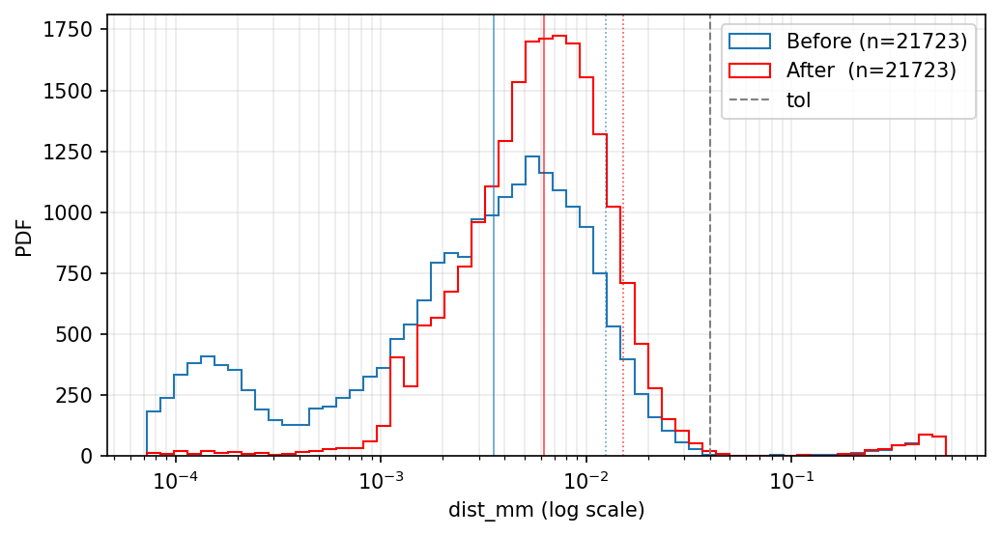

median:  before=0.00355 mm  ->  after=0.00621 mm  (+74.8%)
P90:     before=0.0125 mm ->  after=0.0152 mm (+21.3%)


In [28]:
# test stereo matching
stereomatch = lpt.StereoMatch(cam_list, obj2d_list, tr_cfg)
obj3d_list = stereomatch.match()
print(f"Matched {len(obj3d_list)} 3D objects.")
pts_reconstructed = np.array(
    [[obj._pt_center[0], obj._pt_center[1], obj._pt_center[2]] for obj in obj3d_list], 
    dtype=np.float32)

tol_mm = 0.6 * .04
cmp_st = find_ghosts(pts_groundtrue, pts_reconstructed, tol_mm, use_ckdtree=True)

shaker = lpt.Shake(cam_list, tr_cfg)
print(f"Before Shake: {len(obj3d_list)} 3D objects.")
flags, obj3d_list_sk = shaker.runShake(obj3d_list, image_list)
obj3d_list_sk = [obj3d_list_sk[i] for i in range(len(obj3d_list)) if flags[i] != lpt.ObjFlag.Ghost and flags[i] != lpt.ObjFlag.Repeated]
print(f"After Shake: {len(obj3d_list_sk)} 3D objects remain.")

pts_shaked = np.array(
    [[obj._pt_center[0], obj._pt_center[1], obj._pt_center[2]] for obj in obj3d_list_sk], 
    dtype=np.float32)
tol_mm = 1 * .04
cmp_shake = find_ghosts(pts_groundtrue, pts_shaked, tol_mm, use_ckdtree=True)

def clean_pos(x):
    x = np.asarray(x, float).ravel()
    return x[np.isfinite(x) & (x > 0.0)]  # log 轴不能有 <=0

d0 = clean_pos(cmp_st['dist_mm'])        # before shake
d1 = clean_pos(cmp_shake['dist_mm'])  # after  shake
if d0.size == 0 or d1.size == 0:
    print(f"Empty dist_mm: before={d0.size}, after={d1.size}")
else:
    # shared log-spaced bins on a robust range (1–99 percentile of both)
    all_pos = np.concatenate([d0, d1])
    lo = np.percentile(all_pos, 1)
    hi = np.percentile(all_pos, 99)
    lo = max(lo, np.min(all_pos))     # guard
    edges = np.logspace(np.log10(lo), np.log10(hi), 60)

    fig, ax = plt.subplots(figsize=(7, 3.8), dpi=150)
    ax.hist(d0, bins=edges, density=False, histtype='step', label=f'Before (n={d0.size})')
    ax.hist(d1, bins=edges, density=False, color = 'red', histtype='step', label=f'After  (n={d1.size})')

    ax.set_xscale('log')
    ax.set_xlabel('dist_mm (log scale)')
    ax.set_ylabel('PDF')

    # Reference lines: tolerance, medians, P90
    if 'tol_mm' in globals() and tol_mm and tol_mm > 0:
        ax.axvline(float(tol_mm), color='gray', ls='--', lw=1, label='tol')

    m0, m1 = np.median(d0), np.median(d1)
    p90_0, p90_1 = np.percentile(d0, 90), np.percentile(d1, 90)
    ax.axvline(m0,  ls='-',  lw=0.8, alpha=0.7)
    ax.axvline(m1,  ls='-',  color = 'red', lw=0.8, alpha=0.7)
    ax.axvline(p90_0, ls=':', lw=0.8, alpha=0.7)
    ax.axvline(p90_1, ls=':', color = 'red', lw=0.8, alpha=0.7)

    ax.legend()
    ax.grid(True, which='both', alpha=0.25)
    plt.tight_layout()
    plt.show()

    print(f"median:  before={m0:.3g} mm  ->  after={m1:.3g} mm  ({(m1/m0-1)*100:+.1f}%)")
    print(f"P90:     before={p90_0:.3g} mm ->  after={p90_1:.3g} mm ({(p90_1/p90_0-1)*100:+.1f}%)")


In [ ]:
%%skip #计算残差图
residue_img_list = shaker.calResidualImage(obj3d_list_sk, image_list)
n_cams = len(cam_list)
obj2d_list2 = []
for cam_id in range(n_cams):
    obj2ds = obj_finder.findObject2D(residue_img_list[cam_id], tr_cfg)
    obj2d_list2.append(obj2ds)
    print(f"Camera {cam_id}: found {len(obj2ds)} objects.")

orig_tol_2d_px = tr_cfg._sm_param.tol_2d_px

Camera 0: found 39763 objects.
Camera 1: found 39114 objects.
Camera 2: found 38148 objects.
Camera 3: found 38066 objects.


In [ ]:
%%skip # 检查残差图是否把所有已重构的点都删掉了
tr_cfg._sm_param.tol_2d_px = orig_tol_2d_px + 1/4 * 1
stereomatch2 = lpt.StereoMatch(cam_list, obj2d_list2, tr_cfg)
hit_idx2 = gt_hits_all_active_cams_indices(
    pts_gt=pts_groundtrue,
    cam_list=cam_list,
    obj2d_list=obj2d_list2,
    stereomatch=stereomatch2,                         # lpt.StereoMatch 实例
    tol_2d_px=orig_tol_2d_px + 1/4 * 1,
    lpt=lpt,
    search_radius_factor=2.0
)
print(f"Hit {len(hit_idx2)} ground-truth points in residue images.")

#检查残差图是否把已重构的点完全删掉了
def split_removed_vs_remaining(matched_hit_idx, hit_idx_residual):
    """
    matched_hit_idx   : 第一轮中“命中所有相机且成功重构”的 GT 索引
    hit_idx_residual  : 在残差图上（第二轮检测）再次“命中所有相机”的 GT 索引
    返回:
      fully_removed_hit_idx : 被完全删除的 GT 索引（在残差中未再命中）
      not_removed_hit_idx   : 未完全删除的 GT 索引（在残差中仍命中）
    """
    matched_hit_idx   = np.asarray(matched_hit_idx,  dtype=np.int64)
    hit_idx_residual  = np.asarray(hit_idx_residual, dtype=np.int64)

    not_removed_hit_idx   = np.intersect1d(matched_hit_idx, hit_idx_residual, assume_unique=False)
    fully_removed_hit_idx = np.setdiff1d(matched_hit_idx,   hit_idx_residual, assume_unique=False)
    return fully_removed_hit_idx, not_removed_hit_idx

fully_removed_hit_idx, not_removed_hit_idx = split_removed_vs_remaining(
    matched_hit_idx,  # 第一轮：命中且成功重构的GT索引
    hit_idx2          # 残差图：再次命中的GT索引
)
print(f"Fully removed {len(fully_removed_hit_idx)} points; {len(not_removed_hit_idx)} points remain.")

Hit 15483 ground-truth points in residue images.
Fully removed 18742 points; 1 points remain.


In [31]:
tr_cfg._sm_param.tol_2d_px = orig_tol_2d_px + 1/4 * 1
stereomatch2 = lpt.StereoMatch(cam_list, obj2d_list2, tr_cfg)
obj3d_list2 = stereomatch2.match()
print(f"Matched {len(obj3d_list2)} 3D objects in residue images.")

pts_reconstructed = np.array(
    [[obj._pt_center[0], obj._pt_center[1], obj._pt_center[2]] for obj in obj3d_list2], 
    dtype=np.float32)

tol_mm = 0.6 * .04
cmp_st = find_ghosts(pts_groundtrue, pts_reconstructed, tol_mm, use_ckdtree=True)
print(f"real={len(cmp_st['matched_indices'])}, ghosts={len(cmp_st['ghost_indices'])}")

Matched 12574 3D objects in residue images.
real=10318, ghosts=2256


In [ ]:
%%skip # 检查超过边界的点
stereomatch2 = lpt.StereoMatch(cam_list, obj2d_list2, tr_cfg)

# ---- 选参考相机：在 active 相机里挑 2D 观测最少的 ----
n_cams = len(cam_list)
ref_cam, best = -1, float("inf")
for i in range(n_cams):
    if getattr(cam_list[i], "_is_active"):
        sz = len(obj2d_list2[i])
        if sz < best:
            best = sz
            ref_cam = i
if ref_cam < 0:
    raise RuntimeError("StereoMatch::match: no active camera found.")

# ---- A+B：对每个 ref 观测做 build + check ----
ref_obs_len = len(obj2d_list2[ref_cam])
match_candidates = []
e_check = []
for id_ref in range(ref_obs_len):
    # 种子：只有 ref_cam 是 id_ref，其余相机填 -1
    match_candidate_id = [-1] * n_cams
    match_candidate_id[ref_cam] = id_ref

    # Build across the first m active cams (DFS inside)
    build_candidates = stereomatch2.buildMatch(match_candidate_id)  # -> List[List[int]]

    # for cand in build_candidates:
    #     match_candidates.append(cand)

    for cand in build_candidates:
        ok, e = stereomatch2.checkMatch(cand)  # (ok, candidate_ids after check)
        if ok:
            match_candidates.append(cand)
            e_check.append(e)

# ---- 扁平化 + 排序（保证与 C++ std::sort 一致的确定性）----
match_candidates.sort()
print(f"[collect] candidates after check: {len(match_candidates)}")

# ---- 利用 triangulateMatch(.) 重建所有 match 的 3D 位置 ----
obj3d_list = stereomatch2.triangulateMatch(match_candidates)
pts_reconstructed = (
    np.array([[o._pt_center[0], o._pt_center[1], o._pt_center[2]] for o in obj3d_list], dtype=float)
    if obj3d_list else np.empty((0, 3))
)
print(f"[triangulate] reconstructed 3D points: {len(pts_reconstructed)}")

# ---- 与真实点对比（用你已有的 find_ghosts）----
#   pts_groundtrue: (G,3) 真实 3D 坐标（单位需与重建一致，通常是 mm）
#   tol_mm: 命中阈值（比如 1.0）
cmp_st = find_ghosts(pts_groundtrue, pts_reconstructed, tol_mm, use_ckdtree=True)
print(f"real={len(cmp_st['matched_indices'])}, ghosts={len(cmp_st['ghost_indices'])}")

# ---- Ghost 边界检查（x,y,z 都应在 [-20, 20]）----
lo, hi = -20.0, 20.0
ghost_idx = np.asarray(cmp_st["ghost_indices"], dtype=int)

if ghost_idx.size > 0:
    ghost_pts = pts_reconstructed[ghost_idx]  # (Ng, 3)

    # NaN/Inf 视为非法（算作越界）
    finite_mask = np.isfinite(ghost_pts).all(axis=1)

    # 每轴越界布尔矩阵与“任一轴越界”标记
    oob_axes = (ghost_pts < lo) | (ghost_pts > hi)  # shape (Ng,3)
    oob_any = (~finite_mask) | np.any(oob_axes, axis=1)

    n_total_ghosts = ghost_idx.size
    n_oob_ghosts = int(np.sum(oob_any))

    # 可选：分别统计各轴越界数
    n_oob_x = int(np.sum((~np.isfinite(ghost_pts[:, 0])) | (ghost_pts[:, 0] < lo) | (ghost_pts[:, 0] > hi)))
    n_oob_y = int(np.sum((~np.isfinite(ghost_pts[:, 1])) | (ghost_pts[:, 1] < lo) | (ghost_pts[:, 1] > hi)))
    n_oob_z = int(np.sum((~np.isfinite(ghost_pts[:, 2])) | (ghost_pts[:, 2] < lo) | (ghost_pts[:, 2] > hi)))

    print(f"[ghost boundary] ghosts_total={n_total_ghosts}, ghosts_oob={n_oob_ghosts} "
          f"(x:{n_oob_x}, y:{n_oob_y}, z:{n_oob_z})")

    if n_oob_ghosts > 0:
        bad_idx = ghost_idx[oob_any].tolist()
        print("[ghost boundary] oob ghost indices:", bad_idx)
        # 可选：打印对应坐标（如需）
        # print(ghost_pts[oob_any])
else:
    print("[ghost boundary] no ghosts to check.")

[collect] candidates after check: 21623
[triangulate] reconstructed 3D points: 21623
real=13113, ghosts=8510
[ghost boundary] ghosts_total=8510, ghosts_oob=0 (x:0, y:0, z:0)


{'num_matches': 21623, 'finite_errors': 21623, 'priority_min/max': (0, 4)}


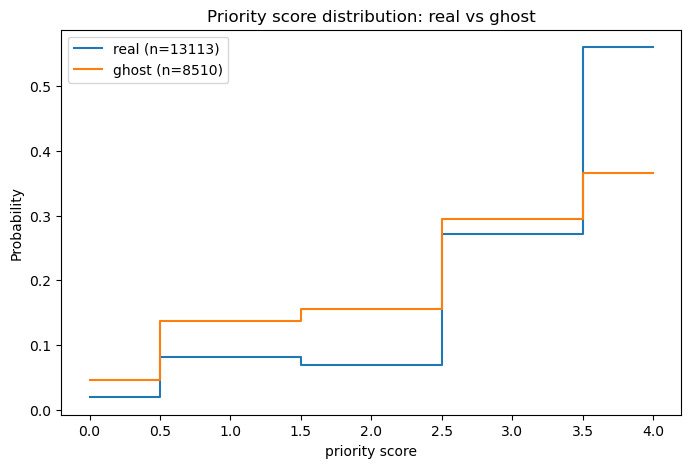

{'real_mean': 3.2713337908945324, 'ghost_mean': 2.7968272620446535, 'real_median': 4.0, 'ghost_median': 3.0, 'score_min': 0, 'score_max': 4}


In [ ]:
%%skip # 计算每个 match 的“优先级分数”（priority score），用于区分真实点与鬼点
import numpy as np

matches = match_candidates  # 如果你用的是 selected_matches，就把这行替换掉

M = len(matches)
tri_errors_mm = np.full(M, np.inf, dtype=float)
used_points = [None] * M   # 每个 match 用到的 (cam, pid) 列表

# ---- 第1遍：算每个 match 的三角化误差，并记录它用到哪些 2D 点 ----
for i, ids in enumerate(matches):
    los = []
    pts = []
    for c, pid in enumerate(ids):
        if pid is None or pid < 0:
            continue
        if pid >= len(obj2d_list[c]) or obj2d_list[c][pid] is None:
            continue
        q = obj2d_list[c][pid]._pt_center
        los.append(cam_list[c].lineOfSight(q))
        pts.append((c, int(pid)))
    used_points[i] = pts


    _, err = lpt.myMATH.triangulation(los)  # 你刚暴露的接口：返回 (Pt3D, error)
    tri_errors_mm[i] = float(err)


# ---- 第2遍：对每个 2D 点找“最小误差”冠军（字典：(cam,pid) -> best_err）----
best_err_for_point = {}
for i in range(M):
    err = tri_errors_mm[i]
    if not np.isfinite(err):
        continue
    for key in used_points[i]:
        be = best_err_for_point.get(key)
        if be is None or err < be:
            best_err_for_point[key] = err

# ---- 第3遍：按你的规则计分。误差并列也算“最小”，加个小容差避免浮点抖动 ----
priority_scores = np.zeros(M, dtype=np.int32)
rtol = 1e-9
atol = 1e-12

for i in range(M):
    err = tri_errors_mm[i]
    if not np.isfinite(err):
        continue
    score = 0
    for key in used_points[i]:
        be = best_err_for_point[key]
        # err <= best_err*(1+rtol) + atol -> 视为并列最小
        if err <= be * (1.0 + rtol) + atol:
            score += 1
    priority_scores[i] = score

print({
    "num_matches": M,
    "finite_errors": int(np.isfinite(tri_errors_mm).sum()),
    "priority_min/max": (int(priority_scores.min()), int(priority_scores.max())),
})

# 需要：priority_scores (len=M, int)，cmp_st 来自 find_ghosts(...)
idx_real  = np.asarray(cmp_st['matched_indices'], dtype=int)
idx_ghost = np.asarray(cmp_st['ghost_indices'], dtype=int)

score_real  = priority_scores[idx_real]  if idx_real.size  else np.array([], dtype=int)
score_ghost = priority_scores[idx_ghost] if idx_ghost.size else np.array([], dtype=int)

all_scores = (np.concatenate([score_real, score_ghost])
              if (score_real.size or score_ghost.size) else np.array([], dtype=int))

if all_scores.size == 0:
    print("No scores to plot.")
else:
    smin, smax = int(all_scores.min()), int(all_scores.max())
    xs = np.arange(smin, smax + 1, dtype=int)

    def pmf(arr):
        if arr.size == 0:
            return np.zeros_like(xs, dtype=float)
        cnt = np.bincount(arr - smin, minlength=len(xs))
        return cnt / cnt.sum()

    pmf_real  = pmf(score_real)
    pmf_ghost = pmf(score_ghost)

    fig = plt.figure(figsize=(8, 5))
    ax = fig.add_subplot(111)
    ax.plot(xs, pmf_real,  drawstyle='steps-mid', label=f"real (n={score_real.size})")
    ax.plot(xs, pmf_ghost, drawstyle='steps-mid', label=f"ghost (n={score_ghost.size})")
    ax.set_xlabel("priority score")
    ax.set_ylabel("Probability")
    ax.set_title("Priority score distribution: real vs ghost")
    ax.legend()
    plt.show()

    print({
        "real_mean":   float(score_real.mean())   if score_real.size else None,
        "ghost_mean":  float(score_ghost.mean())  if score_ghost.size else None,
        "real_median": float(np.median(score_real))   if score_real.size else None,
        "ghost_median":float(np.median(score_ghost))  if score_ghost.size else None,
        "score_min": smin, "score_max": smax,
    })

In [ ]:
%%skip # 检查反投影是否存在不在tol_2d_px内的情况
from math import isfinite

def audit_reverse_violations_all_pairs(matches, cam_list, obj2d_list, stereomatch, tol_px):
    """
    对每个 match、对其用到的所有有序相机对 (k->i) 做反投影检查。
    任一对 (k->i) 的距离 > tol_px，则将该 match 记为违例。
    返回：违例的 match 下标列表。
    """
    bad = []
    for m_idx, ids in enumerate(matches):
        used = [c for c, pid in enumerate(ids) if pid >= 0]
        violated = False
        for k in used:
            qk   = obj2d_list[k][ids[k]]._pt_center
            losk = cam_list[k].lineOfSight(qk)
            for i in used:
                if i == k:
                    continue
                L  = stereomatch.makeLine2DFromLOS3D(i, losk)  # Line2D: .pt, .unit_vector
                px, py = float(L.pt[0]), float(L.pt[1])
                ux, uy = float(L.unit_vector[0]), float(L.unit_vector[1])
                qi     = obj2d_list[i][ids[i]]._pt_center
                dx, dy = float(qi[0]) - px, float(qi[1]) - py
                d = abs(dy*ux - dx*uy)
                if (not isfinite(d)) or (d > float(tol_px)):
                    violated = True
                    break
            if violated:
                break
        if violated:
            bad.append(m_idx)
    return bad


bad = audit_reverse_violations_all_pairs(match_candidates, cam_list, obj2d_list2, stereomatch, tr_cfg._sm_param.tol_2d_px)
print(f"violations: {len(bad)} / {len(match_candidates)}")

violations: 0 / 23082


C:\Users\tan_s\AppData\Local\Temp\ipykernel_15024\4286196450.py:210: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend(loc='lower right')


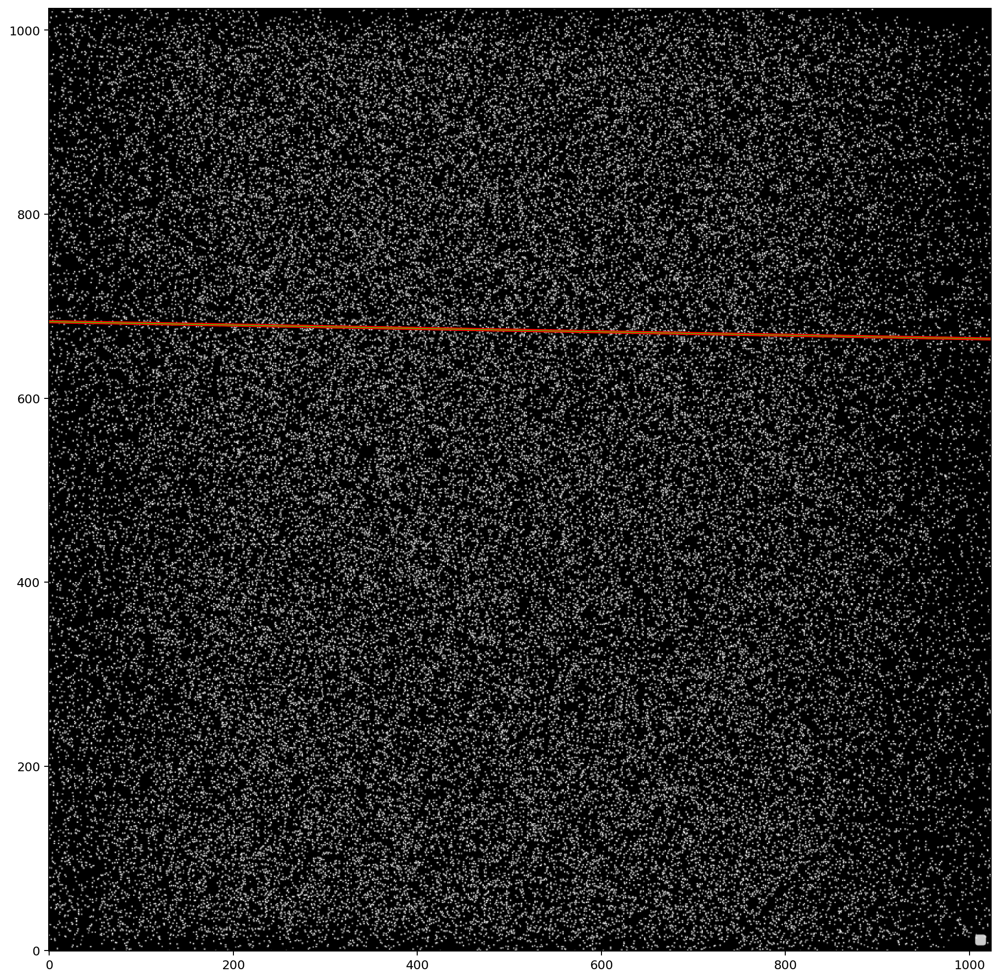

In [ ]:
%%skip #投影线与边界解析解
import numpy as np
import matplotlib.pyplot as plt

# ---------- 取相机矩阵 ----------
def _mat3(M):
    return np.array([[float(M[0,0]), float(M[0,1]), float(M[0,2])],
                     [float(M[1,0]), float(M[1,1]), float(M[1,2])],
                     [float(M[2,0]), float(M[2,1]), float(M[2,2])]], dtype=float)

def _vec3(v):  # Pt3D/Matrix<double> 派生，支持 v[i]
    return np.array([float(v[0]), float(v[1]), float(v[2])], dtype=float)

def _KRt_all(cam):
    P   = cam._pinhole_param
    K   = _mat3(P.cam_mtx)
    R   = _mat3(P.r_mtx)          # 世界->相机
    t   = _vec3(P.t_vec)          # 世界->相机
    Rinv = _mat3(P.r_mtx_inv) if hasattr(P, "r_mtx_inv") else R.T
    Cw   = _vec3(P.t_vec_inv) if hasattr(P, "t_vec_inv") else (-R.T @ t)
    return K, R, t, Rinv, Cw

def _KRt(cam):
    K, R, t, _, _ = _KRt_all(cam)
    return K, R, t

def _skew(t):
    tx,ty,tz = t
    return np.array([[0,-tz,ty],[tz,0,-tx],[-ty,tx,0]], dtype=float)

# ---------- 基础矩阵（去畸变像素域） ----------
def _F_ki(cam_i, cam_k):
    Ki,Ri,ti = _KRt(cam_i)
    Kk,Rk,tk = _KRt(cam_k)
    R = Rk @ Ri.T
    t = tk - Rk @ Ri.T @ ti
    E = _skew(t) @ R
    return np.linalg.inv(Kk).T @ E @ np.linalg.inv(Ki)

# ---------- i 上畸变像素 q_i -> 去畸变像素 x_i'（与 F 域一致） ----------
def _x_ud_on_i_from_q(cam_i, q_i_px, lpt):
    u, v = float(q_i_px[0]), float(q_i_px[1])
    los = cam_i.lineOfSight(lpt.Pt2D(u, v))  # 库里已去畸变 -> 世界射线
    K, R, _ = _KRt(cam_i)
    dw = np.array([los.unit_vector[0], los.unit_vector[1], los.unit_vector[2]], float)
    dc = R @ dw
    xn, yn = dc[0]/dc[2], dc[1]/dc[2]
    return K @ np.array([xn, yn, 1.0], float)  # [u', v', 1]

# ---------- 解析解：去畸变像素域的边界（y 扫描 + x 扫描补洞） ----------
def analytic_cone_boundaries_ud(cam_i, cam_k, q_i_px, tol_px, lpt, n_rows=None, n_cols=None):
    H, W = int(cam_k.getNRow()), int(cam_k.getNCol())
    if n_rows is None: n_rows = H
    if n_cols is None: n_cols = W

    F   = _F_ki(cam_i, cam_k)
    x_i = _x_ud_on_i_from_q(cam_i, q_i_px, lpt)
    l0  = F @ x_i
    a, b, c = float(l0[0]), float(l0[1]), float(l0[2])

    # 右侧上下界（保持与库一致的“仅前两维”）
    E2 = np.diag([1.0, 1.0, 0.0])
    Q  = F @ E2 @ F.T
    q11, q12, q13 = Q[0,0], Q[0,1], Q[0,2]
    q22, q23, q33 = Q[1,1], Q[1,2], Q[2,2]

    T2  = float(tol_px)**2
    eps = 1e-12

    # --- 按 y 扫描，解 x ---
    y = np.linspace(0, H-1, n_rows, dtype=float)
    xlo = np.full_like(y, np.nan); xhi = np.full_like(y, np.nan)
    for k in range(n_rows):
        Y = y[k]
        A = a*a - T2*q11
        B = 2*a*(b*Y + c) - 2*T2*(q12*Y + q13)
        C = (b*Y + c)**2  -  T2*(q22*Y*Y + 2*q23*Y + q33)

        if abs(A) < eps:
            if abs(B) < eps: continue
            x = -C / B
            if 0 <= x <= W-1: xlo[k] = xhi[k] = x
            continue

        D = B*B - 4*A*C
        if D < 0: continue
        r  = D**0.5
        x1 = (-B - r) / (2*A); x2 = (-B + r) / (2*A)
        xl, xr = (x1, x2) if x1 <= x2 else (x2, x1)
        xl = max(xl, 0.0); xr = min(xr, W-1.0)
        if xl <= xr:
            xlo[k], xhi[k] = xl, xr

    # --- 按 x 扫描，解 y（只用于补 y 扫描的空洞） ---
    x = np.linspace(0, W-1, n_cols, dtype=float)
    ylo = np.full_like(x, np.nan); yhi = np.full_like(x, np.nan)
    for k in range(n_cols):
        X = x[k]
        Ay = b*b - T2*q22
        By = 2*b*(a*X + c) - 2*T2*(q12*X + q23)
        Cy = (a*X + c)**2  -  T2*(q11*X*X + 2*q13*X + q33)

        if abs(Ay) < eps:
            if abs(By) < eps: continue
            y_sol = -Cy / By
            if 0 <= y_sol <= H-1: ylo[k] = yhi[k] = y_sol
            continue

        Dy = By*By - 4*Ay*Cy
        if Dy < 0: continue
        r  = Dy**0.5
        y1 = (-By - r) / (2*Ay); y2 = (-By + r) / (2*Ay)
        yl, yr = (y1, y2) if y1 <= y2 else (y2, y1)
        yl = max(yl, 0.0); yr = min(yr, H-1.0)
        if yl <= yr:
            ylo[k], yhi[k] = yl, yr

    return (y, xlo, xhi), (x, ylo, yhi)  # 都在去畸变像素域

# ---------- 去畸变像素 (u',v') -> 畸变像素（叠到原图） ----------
def undist_to_dist_on_cam_k(cam_k, u_ud, v_ud, lpt):
    K,R,t,Rinv,Cw = _KRt_all(cam_k)
    xn = (u_ud - K[0,2]) / K[0,0]
    yn = (v_ud - K[1,2]) / K[1,1]
    d_c = np.array([xn, yn, 1.0], float); d_c /= np.linalg.norm(d_c)
    d_w = Rinv @ d_c
    Xw  = Cw + d_w
    p   = cam_k.project(lpt.Pt3D(Xw[0], Xw[1], Xw[2]))
    return float(p[0]), float(p[1])

# ---------- 线段裁剪到画幅 ----------
def _clip_line_to_image(px, py, ux, uy, W, H, eps=1e-12):
    pts = []
    if abs(ux) > eps:
        t = (0 - px) / ux;      y = py + t*uy
        if 0 <= y <= H-1: pts.append((0, y))
        t = ((W-1) - px) / ux;  y = py + t*uy
        if 0 <= y <= H-1: pts.append((W-1, y))
    if abs(uy) > eps:
        t = (0 - py) / uy;      x = px + t*ux
        if 0 <= x <= W-1: pts.append((x, 0))
        t = ((H-1) - py) / uy;  x = px + t*ux
        if 0 <= x <= W-1: pts.append((x, H-1))
    out = []
    for q in pts:
        if all(abs(q[0]-p[0])>1e-6 or abs(q[1]-p[1])>1e-6 for p in out):
            out.append(q)
    return out[:2]

# ---------- 主函数：画采样线束 + 解析边界（双向补洞） ----------
def plot_on_image(i_idx, k_idx, q_i_px, cam_list, stereomatch, lpt, image_list,
                  tol_px=1.0, n_theta=128, n_rows=None, n_cols=None):
    cam_i, cam_k = cam_list[i_idx], cam_list[k_idx]
    H, W = int(cam_k.getNRow()), int(cam_k.getNCol())

    # 1) 采样线束（畸变域）
    lines = []
    u0, v0 = float(q_i_px[0]), float(q_i_px[1])
    for tt in np.linspace(0, 2*np.pi, n_theta, endpoint=False):
        u = u0 + tol_px*np.cos(tt); v = v0 + tol_px*np.sin(tt)
        los = cam_i.lineOfSight(lpt.Pt2D(u, v))
        L   = stereomatch.makeLine2DFromLOS3D(k_idx, los)   # 畸变域直线
        px, py = float(L.pt[0]), float(L.pt[1])
        ux, uy = float(L.unit_vector[0]), float(L.unit_vector[1])
        seg = _clip_line_to_image(px, py, ux, uy, W, H)
        if len(seg) == 2:
            lines.append(seg)

    # 2) 解析边界（去畸变域）→ 映回畸变域
    (y_ud, xlo_ud, xhi_ud), (x_ud2, ylo_ud, yhi_ud) = analytic_cone_boundaries_ud(
        cam_i, cam_k, q_i_px, tol_px, lpt, n_rows=n_rows, n_cols=n_cols
    )

    # y 扫描
    xlo_d, ylo_d, xhi_d, yhi_d = [], [], [], []
    for uu, vv in zip(xlo_ud, y_ud):
        if np.isfinite(uu):
            xd, yd = undist_to_dist_on_cam_k(cam_k, uu, vv, lpt)
            xlo_d.append(xd); ylo_d.append(yd)
    for uu, vv in zip(xhi_ud, y_ud):
        if np.isfinite(uu):
            xd, yd = undist_to_dist_on_cam_k(cam_k, uu, vv, lpt)
            xhi_d.append(xd); yhi_d.append(yd)

    # x 扫描补洞
    xlo2_d, ylo2_d, xhi2_d, yhi2_d = [], [], [], []
    for vv, uu in zip(ylo_ud, x_ud2):
        if np.isfinite(vv):
            xd, yd = undist_to_dist_on_cam_k(cam_k, uu, vv, lpt)
            xlo2_d.append(xd); ylo2_d.append(yd)
    for vv, uu in zip(yhi_ud, x_ud2):
        if np.isfinite(vv):
            xd, yd = undist_to_dist_on_cam_k(cam_k, uu, vv, lpt)
            xhi2_d.append(xd); yhi2_d.append(yd)

    # 3) 绘制到相机 k 的原图
    img = np.array(image_list[k_idx].to_list(), dtype=np.uint8)
    H, W = img.shape[:2]
    plt.figure(figsize=(W/180*2, H/180*2), dpi=180)
    plt.imshow(img, cmap='gray', interpolation='nearest')

    for (p1, p2) in lines:
        plt.plot([p1[0], p2[0]], [p1[1], p2[1]], color='lime', lw=0.5, alpha=0.6)

    # if xlo_d:  plt.plot(xlo_d,  ylo_d,  'r', lw=2, label='analytic lower (y-scan)')
    # if xhi_d:  plt.plot(xhi_d,  yhi_d,  'r', lw=2, label='analytic upper (y-scan)')
    if xlo2_d: plt.plot(xlo2_d, ylo2_d, 'r', lw=1)
    if xhi2_d: plt.plot(xhi2_d, yhi2_d, 'r', lw=1)

    plt.gca().invert_yaxis()
    plt.legend(loc='lower right')
    plt.tight_layout()
    plt.show()

i_idx, k_idx = 0, 1
pid_i = 40000
q_i_px = obj2d_list[i_idx][pid_i]._pt_center  # 或 (u, v)
plot_on_image(i_idx, k_idx, q_i_px,
              cam_list=cam_list,
              stereomatch=stereomatch,
              lpt=lpt,
              image_list=image_list,
              tol_px=1,        # 你要验证的半径
              n_theta=256,       # 采样线更平滑
              n_rows=None,       # 用全高扫描
              n_cols=None)       # 用全宽补洞

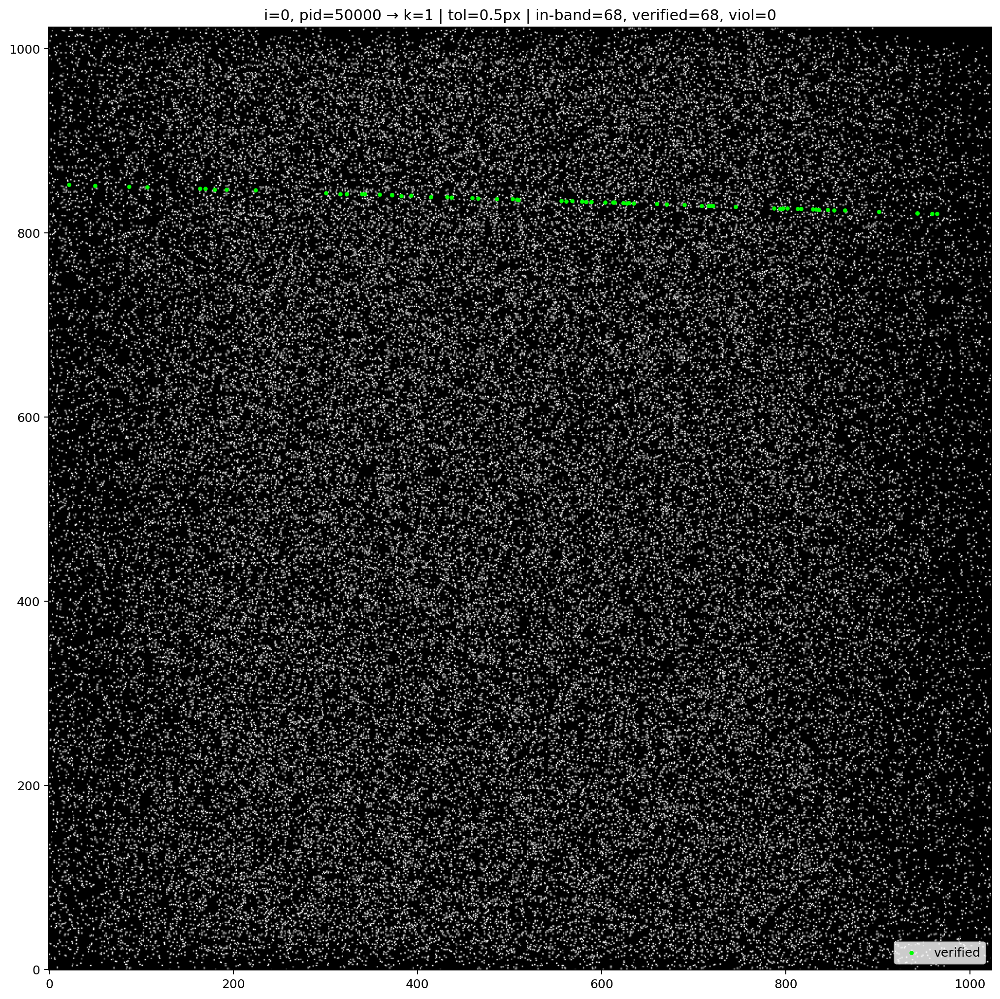

in-band=68, verified=68, viol=0


In [ ]:
%%skip #---------- 选点 + 画图：反投影核验（去畸变像素域） ----------
import numpy as np
import matplotlib.pyplot as plt
from math import isfinite

# --- 小工具 ---
def _mat3(M):
    return np.array([[float(M[0,0]), float(M[0,1]), float(M[0,2])],
                     [float(M[1,0]), float(M[1,1]), float(M[1,2])],
                     [float(M[2,0]), float(M[2,1]), float(M[2,2])]], float)

def _KRt(cam):
    P = cam._pinhole_param
    K = _mat3(P.cam_mtx); R = _mat3(P.r_mtx)
    t = np.array([float(P.t_vec[0]), float(P.t_vec[1]), float(P.t_vec[2])], float)
    return K, R, t

def _skew(t):
    tx,ty,tz = t; return np.array([[0,-tz,ty],[tz,0,-tx],[-ty,tx,0]], float)

def _F_ki(cam_i, cam_k):
    Ki,Ri,ti = _KRt(cam_i); Kk,Rk,tk = _KRt(cam_k)
    R = Rk @ Ri.T
    t = tk - Rk @ Ri.T @ ti
    E = _skew(t) @ R
    return np.linalg.inv(Kk).T @ E @ np.linalg.inv(Ki)

def _x_ud_from_q(cam, q_px, lpt):
    u, v = float(q_px[0]), float(q_px[1])
    los  = cam.lineOfSight(lpt.Pt2D(u, v))       # 已去畸变的世界射线
    K, R, _ = _KRt(cam)
    dw = np.array([los.unit_vector[0], los.unit_vector[1], los.unit_vector[2]], float)
    dc = R @ dw
    xn, yn = dc[0]/dc[2], dc[1]/dc[2]
    return K @ np.array([xn, yn, 1.0], float)    # undist 像素齐次

# --- 主函数：选点 + 画图 ---
def select_and_plot_inliers_on_k(i_idx, k_idx, pid_i,
                                 cam_list, obj2d_list, image_list, stereomatch, lpt,
                                 tol_px, eps_ineq=1e-6, eps_dist=1e-6, show_viol=False):
    """
    返回 (band_idx_k, verified_idx_k, viol_idx_k)，并把 verified 点画在相机 k 的图像上。
    """
    cam_i, cam_k = cam_list[i_idx], cam_list[k_idx]
    q_i = obj2d_list[i_idx][pid_i]._pt_center
    T   = float(tol_px)

    # 预计算（undist 域）
    F   = _F_ki(cam_i, cam_k)
    x_i = _x_ud_from_q(cam_i, q_i, lpt)

    band_idx, verified_idx, viol_idx = [], [], []

    # 遍历相机 k 的所有 2D 点
    for idx_k, ok in enumerate(obj2d_list[k_idx]):
        q_k = ok._pt_center

        # 条带不等式：|L| ≤ T * ||g||
        x_k = _x_ud_from_q(cam_k, q_k, lpt)
        Fxk = F.T @ x_k
        g2  = float(Fxk[0]**2 + Fxk[1]**2)
        if g2 <= 0.0: 
            continue
        L = float(x_k @ F @ x_i)
        if abs(L) > T * (g2**0.5) + eps_ineq:
            continue  # 不在条带内
        band_idx.append(idx_k)

        # 反投到相机 i：q_k 的 LOS → i 上的 Line2D，量 q_i 到线的像素正交距离
        los_k = cam_k.lineOfSight(lpt.Pt2D(float(q_k[0]), float(q_k[1])))
        L2D   = stereomatch.makeLine2DFromLOS3D(i_idx, los_k)  # dist 域直线
        px, py = float(L2D.pt[0]), float(L2D.pt[1])
        ux, uy = float(L2D.unit_vector[0]), float(L2D.unit_vector[1])
        dx, dy = float(q_i[0]) - px, float(q_i[1]) - py
        d = abs(dy*ux - dx*uy)  # 正交距离
        if isfinite(d) and d <= T + eps_dist:
            verified_idx.append(idx_k)
        else:
            viol_idx.append(idx_k)

    # 画图：相机 k 的图像 + 通过核验的点
    img = np.array(image_list[k_idx].to_list(), dtype=np.uint8)
    xs_ok = [float(obj2d_list[k_idx][j]._pt_center[0]) for j in verified_idx]
    ys_ok = [float(obj2d_list[k_idx][j]._pt_center[1]) for j in verified_idx]

    plt.figure(figsize=(img.shape[1]/180*2, img.shape[0]/180*2), dpi=180)
    plt.imshow(img, cmap='gray', interpolation='nearest')
    if xs_ok:
        plt.scatter(xs_ok, ys_ok, s=6, c='lime', marker='o', label='verified')
    if show_viol and len(viol_idx):
        xs_bad = [float(obj2d_list[k_idx][j]._pt_center[0]) for j in viol_idx]
        ys_bad = [float(obj2d_list[k_idx][j]._pt_center[1]) for j in viol_idx]
        plt.scatter(xs_bad, ys_bad, s=6, c='red', marker='x', label='in-band but dist>tol')
    plt.gca().invert_yaxis()
    plt.title(f"i={i_idx}, pid={pid_i} → k={k_idx} | tol={tol_px}px | "
              f"in-band={len(band_idx)}, verified={len(verified_idx)}, viol={len(viol_idx)}")
    if xs_ok or (show_viol and len(viol_idx)):
        plt.legend(loc='lower right')
    plt.tight_layout(); plt.show()

    return band_idx, verified_idx, viol_idx

i_idx, k_idx = 0, 1
pid_i = 50000
band_idx, verified_idx, viol_idx = select_and_plot_inliers_on_k(
    i_idx, k_idx, pid_i,
    cam_list=cam_list, obj2d_list=obj2d_list, image_list=image_list,
    stereomatch=stereomatch, lpt=lpt,
    tol_px=tr_cfg._sm_param.tol_2d_px,
    show_viol=True  # 想看被判“条带内但反投>tol”的点就开
)
print(f"in-band={len(band_idx)}, verified={len(verified_idx)}, viol={len(viol_idx)}")

In [ ]:
import pyopenlpt as lpt

config_file = "D:/0.Code/Test/SD0075/config.txt"
with lpt.PythonStreamRedirector():
    lpt.run(config_file)

Estimating OTF...
Camera 0 (a,b,c,alpha) = 124.00,0.51,0.51,0.00

Camera 1 (a,b,c,alpha) = 124.00,0.51,0.53,0.00

Camera 2 (a,b,c,alpha) = 124.00,0.50,0.51,0.00

Camera 3 (a,b,c,alpha) = 124.00,0.50,0.51,0.00

**************
OpenLPT start!
**************

Initial phase at frame 0
START IPR...
Full cameras
Combination 0 cams=[0, 1, 2, 3]
		2D detections per active camera: 53072  53111  53312  53551   (0.02 s)
		Matched 34640 objects. ( 2D tol: 0.50, t:4.37 s)	After shaking: 34640 objects remain. (0.92 s)
	LOOP=0: TOTAL OBJECTS = 34640
		2D detections per active camera: 22446  22230  22272  22753   (0.01 s)
		Matched 7785 objects. ( 2D tol: 0.75, t:1.47 s)	After shaking: 7173 objects remain. (0.28 s)
	LOOP=1: TOTAL OBJECTS = 41813
		2D detections per active camera: 15920  15716  15676  16229   (0.01 s)
		Matched 4464 objects. ( 2D tol: 1.12, t:0.53 s)	After shaking: 3686 objects remain. (0.18 s)
	LOOP=2: TOTAL OBJECTS = 45499
		2D detections per active camera: 12531  12310  12331  12818 